In [1]:
from google.colab import drive

drive.mount('/gdrive',force_remount = True)
%cd /gdrive/My Drive/[2024-2025] AN2DL/Homework 2

Mounted at /gdrive
/gdrive/My Drive/[2024-2025] AN2DL/Homework 2


# Import Libraries

In [5]:
# Set seed for reproducibility
seed = 42

# Import necessary libraries
import os

# Set environment variables before importing modules
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd() + '/configs/'

# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

# Import necessary modules
import logging
import random
import numpy as np
import albumentations as A
from sklearn.ensemble import IsolationForest


# Set seeds for random number generators in NumPy and Python
np.random.seed(seed)
random.seed(seed)

# Import TensorFlow and Keras
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# Set seed for TensorFlow
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

# Reduce TensorFlow verbosity
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

# Print TensorFlow version
print(tf.__version__)

# Import other libraries
import cv2
from tensorflow.keras.applications.mobilenet import preprocess_input
#from tensorflow_addons.layers import InstanceNormalization, GroupNormalization # This should work now
#from keras.layers import LayerNormalization
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.colors as mcolors
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix
from PIL import Image
import matplotlib.gridspec as gridspec
import requests
from io import BytesIO
import pandas as pd
from keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate, BatchNormalization, Activation, add
from keras.models import Model, model_from_json
from keras.optimizers import Adam
from keras.optimizers import AdamW
# Configure plot display settings
sns.set(font_scale=1.4)
sns.set_style('white')
plt.rc('font', size=14)
%matplotlib inline

2.17.1


# EXPLORATORY DATA ANALYSIS


In [6]:
data = np.load("/gdrive/MyDrive/[2024-2025] AN2DL/Homework 2/mars_for_students.npz")
training_set = data["training_set"]

X = training_set[:, 0]
y = training_set[:, 1]

X_test_kaggle = data["test_set"]

Analyze test set

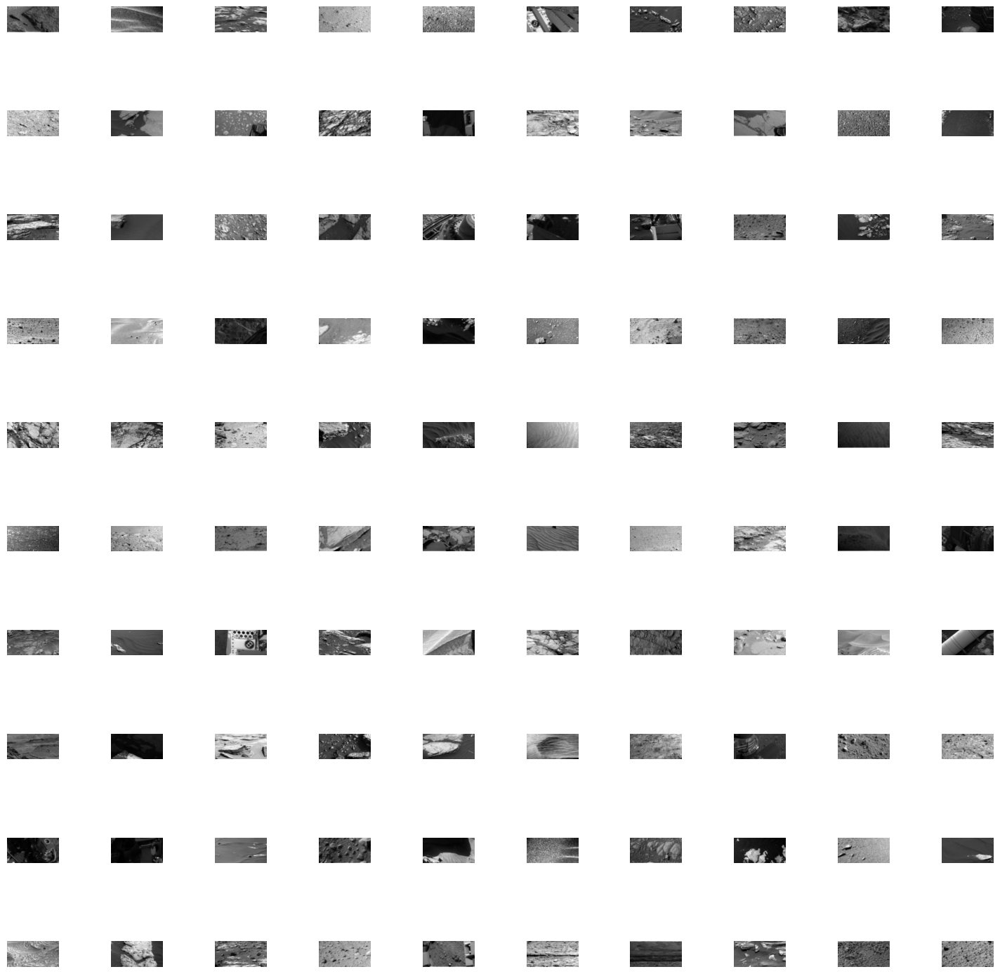

In [7]:
def display_images(images, num_images=100):
    """
    Displays a grid of images, ensuring grayscale display for single-channel images.

    Args:
    images: A NumPy array of images. Shape should be (num_images, height, width, channels).
    num_images: The number of images to display.
    """

    num_cols = 10
    num_rows = int(np.ceil(num_images / num_cols))

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
    fig.tight_layout()

    for i in range(num_images):
        row = i // num_cols
        col = i % num_cols

        # Always display single-channel images as grayscale
        axes[row, col].imshow(images[i], cmap='gray')  # Set cmap='gray' here
        axes[row, col].axis('off')

    plt.show()

# Display the first 100 images from X_test
display_images(X_test_kaggle[:100])

In [8]:
# Distribution of classes (number of pixels for each class)
classes,count = np.unique(y,return_counts=True)
print(classes)
print(count)
input_shape = X[0].shape
print(input_shape)
output_shape = y[0].shape
print(output_shape)

[0. 1. 2. 3. 4.]
[5466886 7131118 4863930 3933183   26963]
(64, 128)
(64, 128)


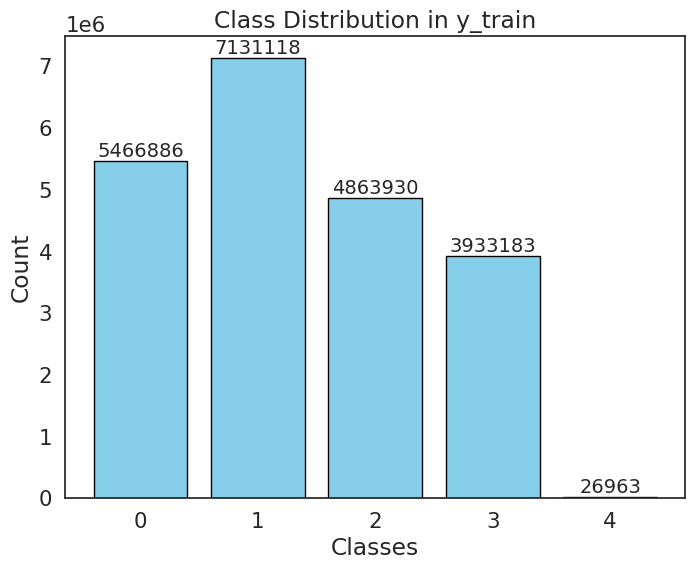

In [9]:
# Plot classes distribution
plt.figure(figsize=(8, 6))
plt.bar(classes, count, color='skyblue', edgecolor='black')
plt.xlabel("Classes")
plt.ylabel("Count")
plt.title("Class Distribution in y_train")

for i, count in enumerate(count):
    plt.text(classes[i], count + 0.1, str(count), ha='center', va='bottom')
plt.show()

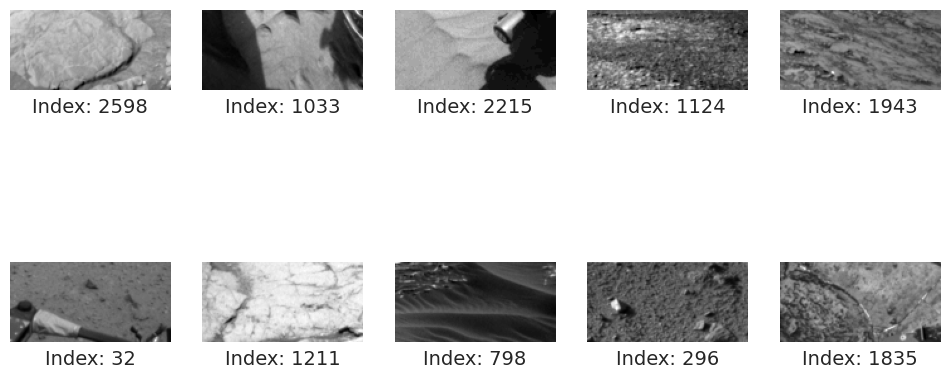

In [10]:
# Plot of 10 random images from the training set, with the relative index
random_indices = np.random.choice(len(X), size=10, replace=False)
num_images_to_plot = 10
plt.figure(figsize=(12, 6))
for index,value in enumerate(random_indices):
  ax = plt.subplot(2, 5, index + 1)
  plt.imshow(X[value],cmap = 'gray')
  plt.text(0.5, -0.1, f"Index: {value}", ha='center', va='top',
             transform=ax.transAxes)
  plt.axis('off')
plt.show()

In [11]:
print(random_indices)

[2598 1033 2215 1124 1943   32 1211  798  296 1835]


In [12]:
print(X[2535])

[[42. 45. 46. ... 58. 57. 57.]
 [40. 45. 47. ... 58. 59. 58.]
 [41. 46. 47. ... 60. 60. 67.]
 ...
 [40. 43. 46. ... 55. 56. 58.]
 [40. 45. 46. ... 55. 55. 55.]
 [41. 46. 46. ... 55. 55. 53.]]


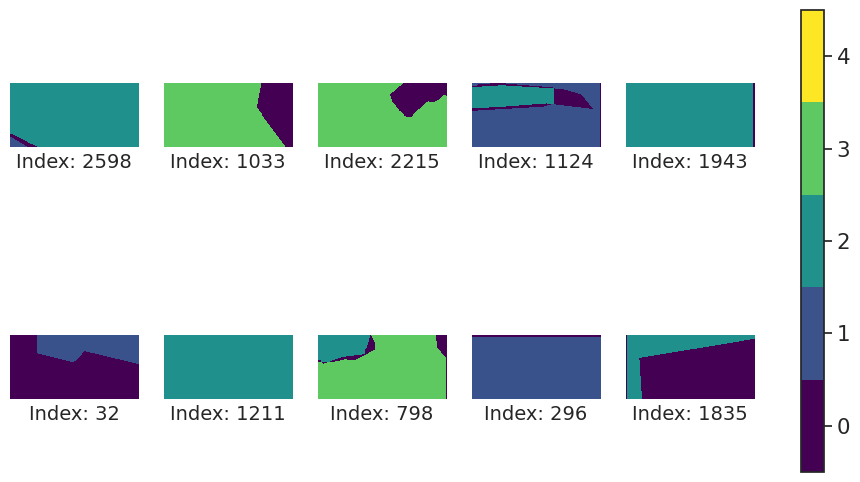

In [13]:
# Get unique labels from y_train
unique_labels = np.unique(y)

# Create a dictionary mapping labels to color indices
label_to_color_index = {label: i for i, label in enumerate(unique_labels)}
cmap = plt.cm.get_cmap('viridis', len(unique_labels))
# Plot the masks
fig, axes = plt.subplots(figsize=(12, 6), nrows=2, ncols=5)
num_images_to_plot = 10
for index, value in enumerate(random_indices):
    ax = axes.flat[index]
    # Apply colormap using the label mapping
    colored_image = np.vectorize(label_to_color_index.get)(y[value])
    # Set vmin and vmax to match unique_labels
    im = ax.imshow(colored_image, cmap=cmap, interpolation='nearest',
                   vmin=unique_labels.min(), vmax=unique_labels.max())
    ax.axis('off')
    ax.text(0.5, -0.1, f"Index: {value}", ha='center', va='top',
            transform=ax.transAxes)

# Add colorbar to the figure, to distinguish the 5 classes
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), ticks=unique_labels,
                    boundaries=np.arange(unique_labels.min() - 0.5, unique_labels.max() + 1.5, 1))

plt.show()

EXPLORATORY ANALYSIS OF THE LESS PRESENT CLASS


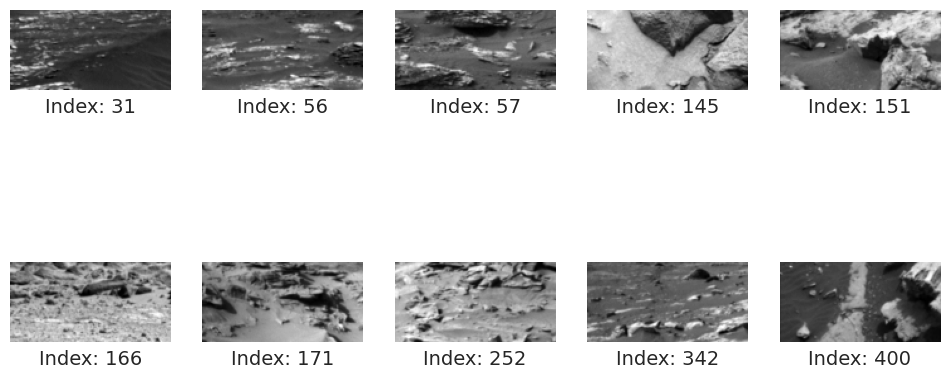

In [14]:
# Plot of 10 random images containing the less represented class in the dataset (big rocks, class 4)
indices_with_4 = [i for i, img in enumerate(y) if 4 in img]
num_images_to_plot = 10

plt.figure(figsize=(12, 6))

for index, value in enumerate(indices_with_4[:num_images_to_plot]):
    ax = plt.subplot(2, 5, index + 1)
    plt.imshow(X[value], cmap='gray')
    plt.axis('off')
    plt.text(0.5, -0.1, f"Index: {value}", ha='center', va='top',
             transform=ax.transAxes)

plt.show()

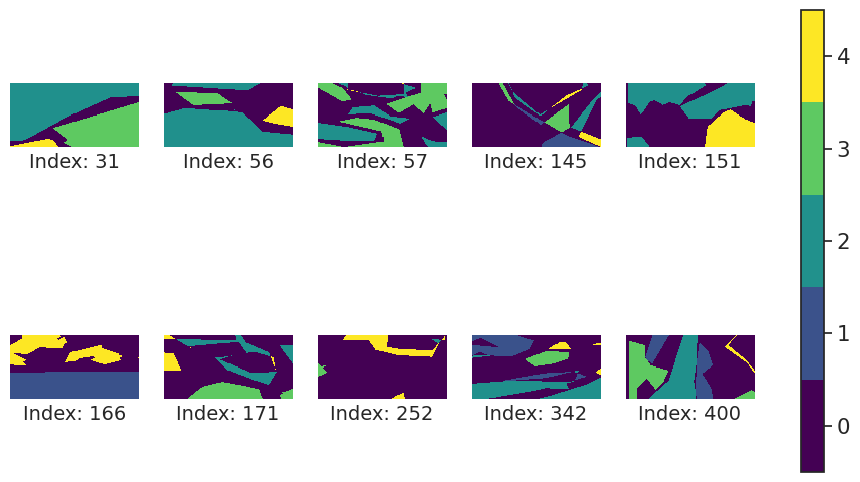

In [15]:
# Display corresponding masks
label_to_color_index = {label: i for i, label in enumerate(unique_labels)}
cmap = plt.cm.get_cmap('viridis', len(unique_labels))
fig, axes = plt.subplots(figsize=(12, 6), nrows=2, ncols=5)
num_images_to_plot = 10
for i,index in enumerate(indices_with_4[:num_images_to_plot]):
    ax = axes.flat[i]
    # Apply colormap using the label mapping
    colored_image = np.vectorize(label_to_color_index.get)(y[index])
    # Set vmin and vmax to match unique_labels
    im = ax.imshow(colored_image, cmap=cmap, interpolation='nearest',
                   vmin=unique_labels.min(), vmax=unique_labels.max())
    ax.axis('off')
    ax.text(0.5, -0.1, f"Index: {index}", ha='center', va='top',
            transform=ax.transAxes)

# Add colorbar to the figure, specifying ticks and boundaries
cbar = fig.colorbar(im, ax=axes.ravel().tolist(), ticks=unique_labels,
                    boundaries=np.arange(unique_labels.min() - 0.5, unique_labels.max() + 1.5, 1))
plt.show()

# Outlier Removal


In [16]:
identical_image_groups = []
processed_indices = set()  # Keep track of processed images

for i, img1 in enumerate(y):
    if i in processed_indices:
        continue

    identical_indices = [i]  # Start with the current image
    for j, img2 in enumerate(y[i + 1:]):  # Compare with remaining images
        if np.array_equal(img1, img2):
            identical_indices.append(i + 1 + j)  # Add index of identical image
            processed_indices.add(i + 1 + j)  # Mark as processed

    if len(identical_indices) > 1:  # Add to groups if more than one identical image found
        identical_image_groups.append(identical_indices)

print("Groups of identical images (indices):", identical_image_groups)

Groups of identical images (indices): [[5, 127, 165, 397, 559, 792, 797, 806, 965, 1267, 1371, 1489, 1505, 1545, 1600, 1650, 1801, 1971, 1980, 2119, 2198, 2244, 2302, 2385, 2425, 2461], [9, 109, 163, 190, 233, 267, 306, 368, 410, 431, 548, 569, 593, 614, 618, 768, 919, 933, 994, 1060, 1074, 1305, 1451, 1567, 1638, 1811, 1869, 1882, 1895, 1916, 2012, 2025, 2032, 2037, 2113, 2349, 2447, 2451, 2484, 2612], [13, 43, 67, 83, 88, 134, 247, 300, 309, 458, 474, 488, 504, 523, 544, 558, 567, 578, 599, 601, 644, 656, 661, 670, 704, 727, 788, 845, 859, 899, 948, 973, 974, 984, 993, 1120, 1138, 1189, 1219, 1334, 1336, 1338, 1410, 1413, 1506, 1553, 1563, 1564, 1573, 1710, 1722, 1723, 1732, 1739, 1777, 1792, 1796, 1880, 1893, 1918, 1926, 1939, 1973, 1984, 2027, 2059, 2061, 2062, 2074, 2082, 2089, 2102, 2106, 2123, 2152, 2170, 2212, 2258, 2261, 2266, 2306, 2311, 2319, 2336, 2348, 2401, 2426, 2427, 2442, 2469, 2487, 2577, 2582, 2586, 2605], [17, 78, 576, 1636, 2446], [19, 25, 44, 63, 64, 66, 69, 74, 8

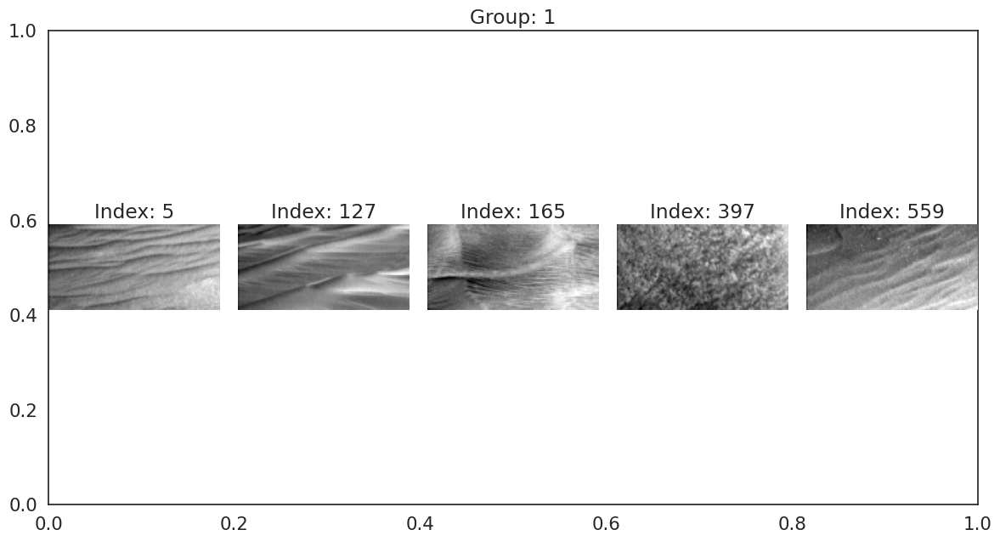

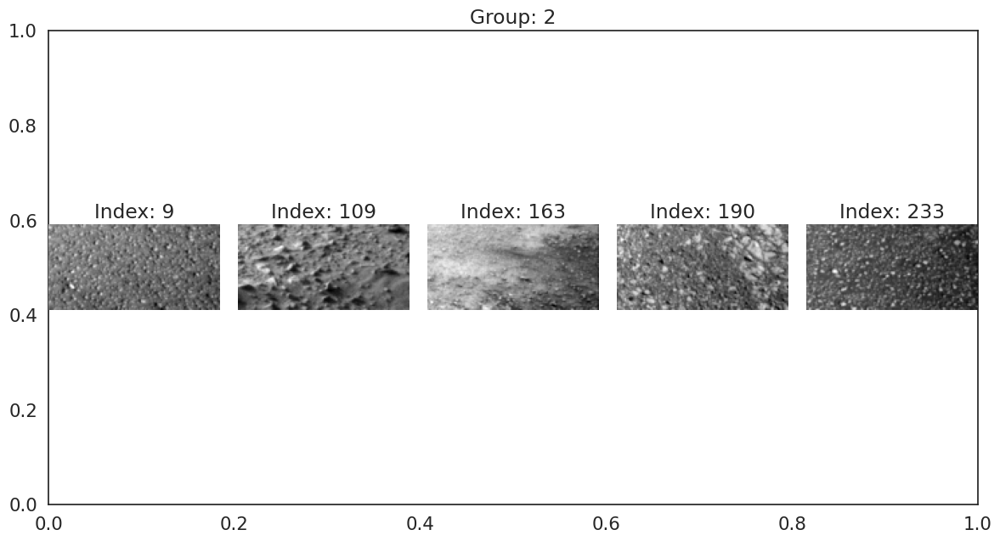

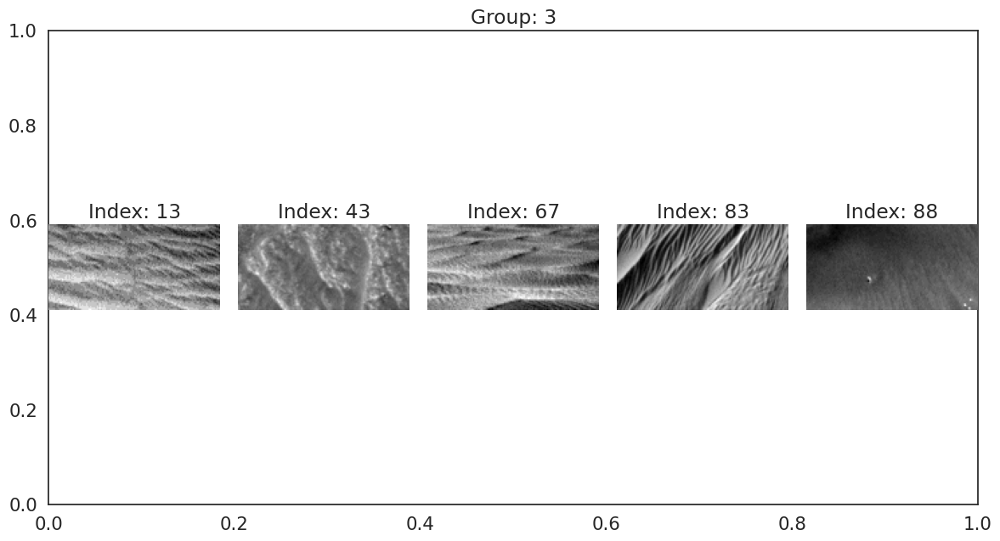

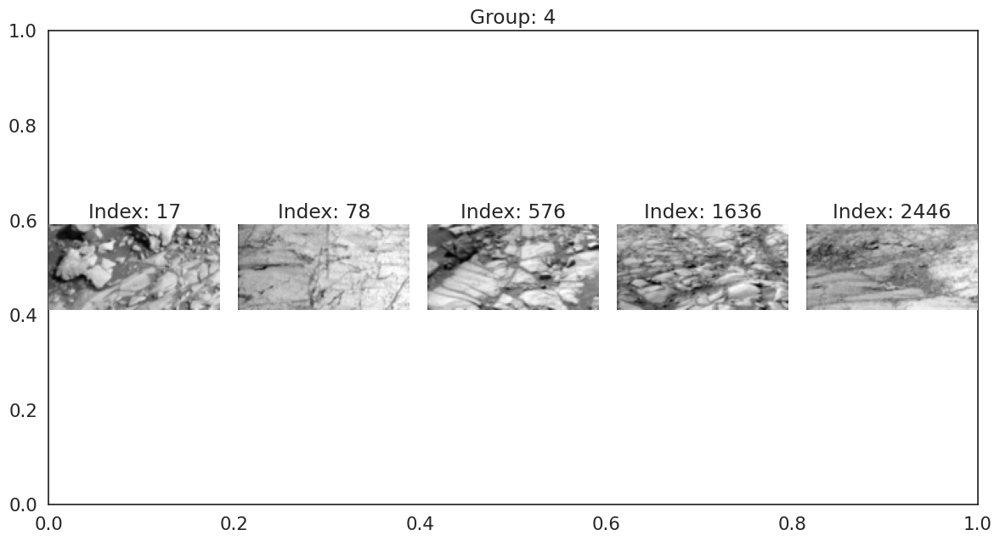

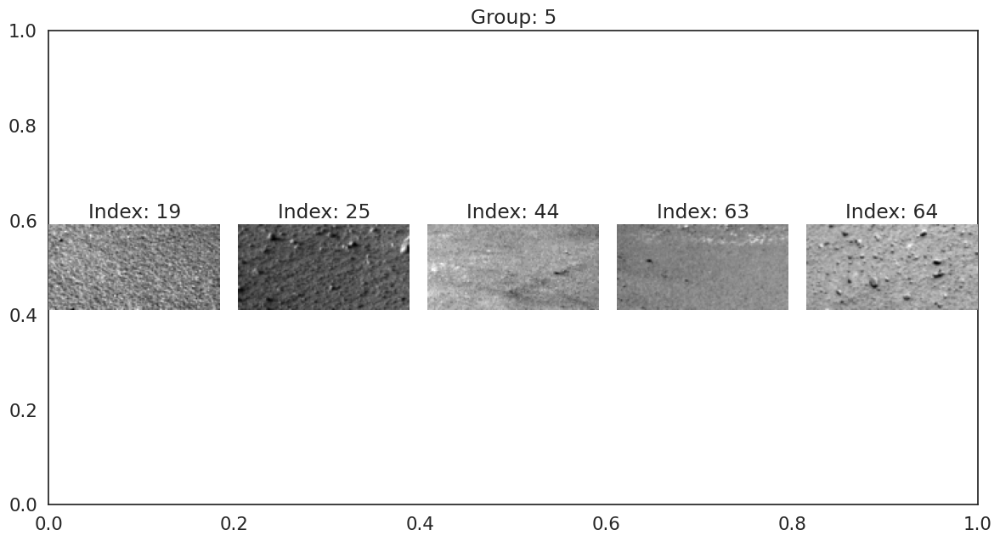

...

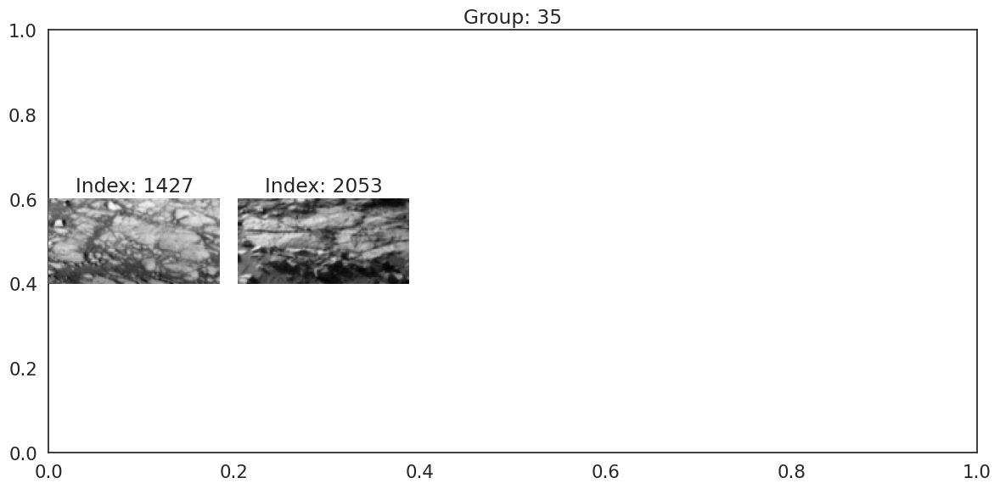

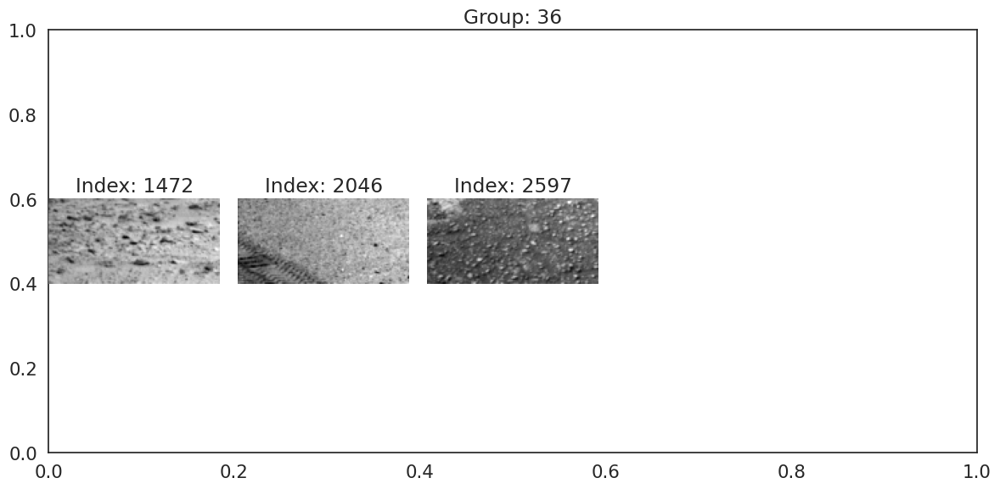

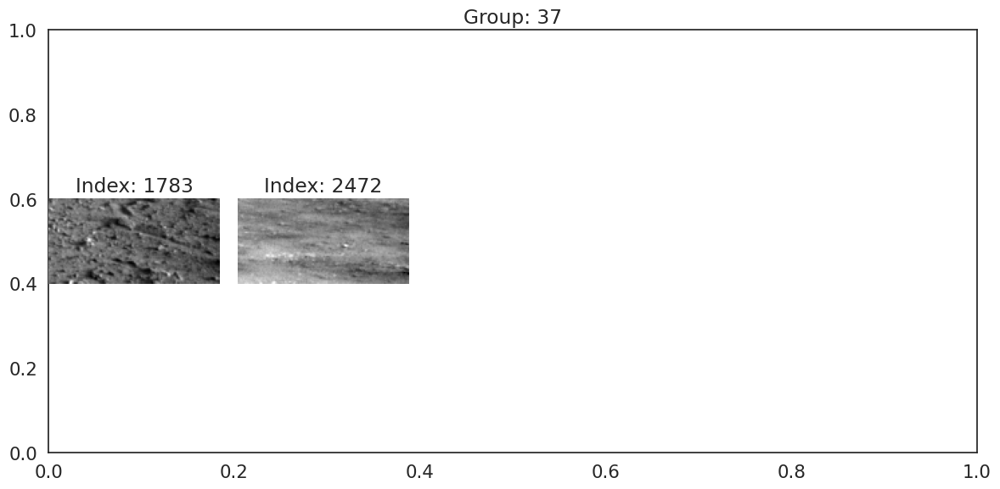

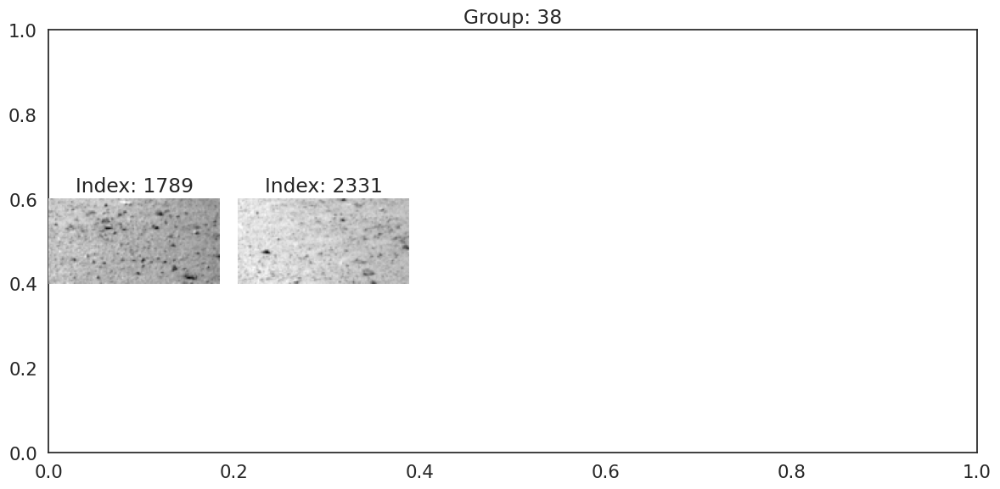

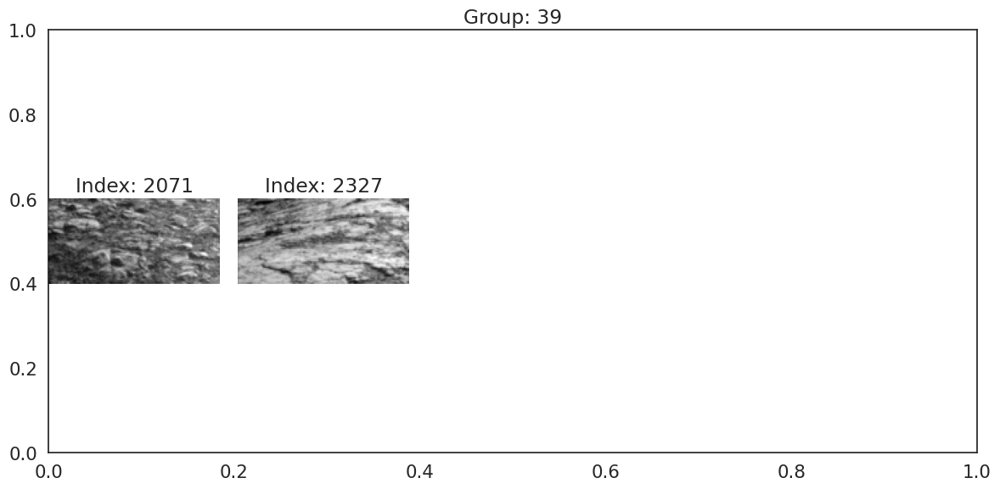

In [17]:
# Iterate through each group in identical_image_groups
j = 1
# Iterate through each group in identical_image_groups
for group_indices in identical_image_groups:
    # Create a figure for the current group
    plt.figure(figsize=(12, 6))
    plt.title(f"Group: {j}")  # Set title using the first index of the group
    j = j + 1
    # Plot up to 5 images in the group
    for i, index in enumerate(group_indices[:5]):
        plt.subplot(1, 5, i + 1)
        plt.imshow(X[index], cmap='gray')
        plt.title(f"Index: {index}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

In [18]:
index_outliers = identical_image_groups[11]
print(index_outliers)

[62, 79, 125, 139, 142, 147, 152, 156, 170, 210, 217, 266, 289, 299, 313, 339, 348, 365, 412, 417, 426, 450, 461, 536, 552, 669, 675, 741, 744, 747, 799, 802, 808, 820, 821, 849, 863, 890, 909, 942, 971, 1005, 1057, 1079, 1082, 1092, 1095, 1106, 1119, 1125, 1177, 1194, 1224, 1247, 1248, 1258, 1261, 1262, 1306, 1324, 1365, 1370, 1443, 1449, 1508, 1509, 1519, 1551, 1584, 1588, 1628, 1637, 1693, 1736, 1767, 1768, 1782, 1813, 1816, 1834, 1889, 1925, 1942, 1975, 1979, 2000, 2002, 2086, 2096, 2110, 2111, 2151, 2161, 2222, 2235, 2239, 2242, 2301, 2307, 2350, 2361, 2365, 2372, 2414, 2453, 2522, 2535, 2561, 2609, 2614]


In [19]:
X = np.delete(X, index_outliers, axis=0)
y = np.delete(y, index_outliers, axis=0)


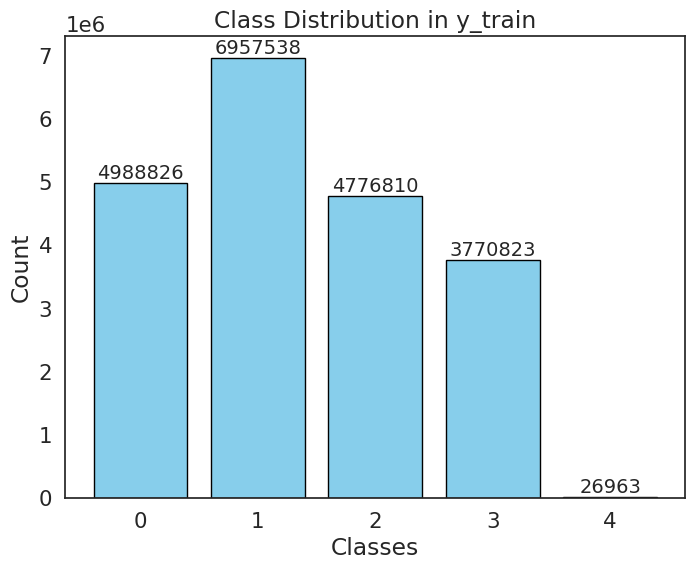

In [20]:
# Plot of the classes distribution, without outliers
classes,count = np.unique(y,return_counts=True)

plt.figure(figsize=(8, 6))
plt.bar(classes, count, color='skyblue', edgecolor='black')
plt.xlabel("Classes")
plt.ylabel("Count")
plt.title("Class Distribution in y_train")
for i, count in enumerate(count):
    plt.text(classes[i], count , str(count), ha='center', va='bottom')

plt.show()

# Training and validation split


In [21]:
!pip install git+https://github.com/trent-b/iterative-stratification.git

  Cloning https://github.com/trent-b/iterative-stratification.git to /tmp/pip-req-build-icbvvkdz
  Running command git clone --filter=blob:none --quiet https://github.com/trent-b/iterative-stratification.git /tmp/pip-req-build-icbvvkdz
  Resolved https://github.com/trent-b/iterative-stratification.git to commit c763bd5440e5f03c6447471305897c1046fc4838
  Preparing metadata (setup.py) ... done
  Created wheel for iterative-stratification: filename=iterative_stratification-0.1.9-py3-none-any.whl size=8444 sha256=8db4f71f3177e2935ea296a4d490d2f16ae98532696319c55f2a124110b6d144
  Stored in directory: /tmp/pip-ephem-wheel-cache-vel28z25/wheels/d9/65/19/29be575735008d8d4c21b322392a512ee88d4cd7849c817417
Successfully built iterative-stratification


In [22]:
from iterstrat.ml_stratifiers import MultilabelStratifiedShuffleSplit
num_classes = len(np.unique(y))
y_train_strat = np.zeros((y.shape[0], num_classes), dtype=int)
for i, label in enumerate(y):
    unique_values = np.unique(label)
    for value in unique_values:
        y_train_strat[i, int(value)] = 1

# Create a MultilabelStratifiedShuffleSplit instance
msss = MultilabelStratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

# Perform the split
train_index, val_index = next(msss.split(X, y_train_strat))

# Get the training and validation sets, and plot their size
X_train, X_val = X[train_index], X[val_index]
y_train, y_val = y[train_index], y[val_index]

print("Training set shape:", X_train.shape, y_train.shape)
print("Validation set shape:", X_val.shape, y_val.shape)

Training set shape: (2004, 64, 128) (2004, 64, 128)
Validation set shape: (501, 64, 128) (501, 64, 128)


In [23]:
print(y_val[0])
print(y_train[0])

[[2. 2. 2. ... 2. 2. 2.]
 [2. 2. 2. ... 2. 2. 2.]
 [2. 2. 2. ... 2. 2. 2.]
 ...
 [2. 2. 2. ... 0. 0. 0.]
 [2. 2. 2. ... 0. 0. 0.]
 [2. 2. 2. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


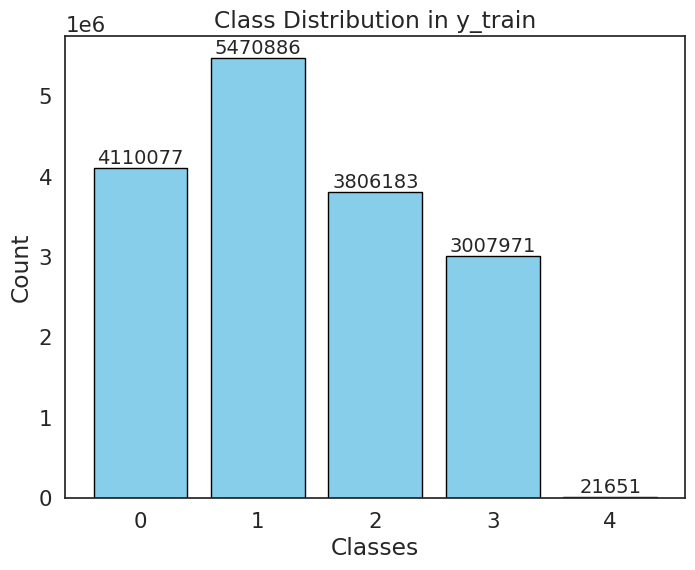

In [24]:
# Plot the class distribution in y_train
classes,count = np.unique(y_train,return_counts=True)

plt.figure(figsize=(8, 6))
plt.bar(classes, count, color='skyblue', edgecolor='black')

plt.xlabel("Classes")
plt.ylabel("Count")
plt.title("Class Distribution in y_train")

for i, count in enumerate(count):
    plt.text(classes[i], count , str(count), ha='center', va='bottom')

plt.show()

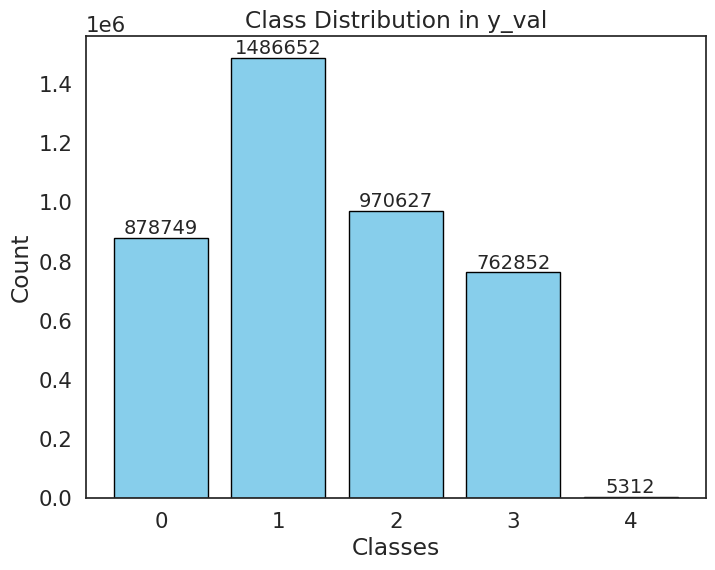

In [25]:
# Plot the class distribution in y_val
classes,count = np.unique(y_val,return_counts=True)

plt.figure(figsize=(8, 6))
plt.bar(classes, count, color='skyblue', edgecolor='black')

plt.xlabel("Classes")
plt.ylabel("Count")
plt.title("Class Distribution in y_val")

for i, count in enumerate(count):
    plt.text(classes[i], count , str(count), ha='center', va='bottom')

plt.show()

In [26]:
# Create a MultilabelStratifiedShuffleSplit instance for train/val split
msss_train_val = MultilabelStratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

# Perform the train/val split
train_index, val_index = next(msss_train_val.split(X, y_train_strat))

# Get the training and validation sets
X_train, X_val = X[train_index], X[val_index]
y_train, y_val = y[train_index], y[val_index]

# Split the training set further into train and test sets
msss_train_test = MultilabelStratifiedShuffleSplit(n_splits=1, test_size=0.125, random_state=42)

# Create a multi-hot encoded target for the remaining data
y_train_strat_remaining = np.zeros((y_train.shape[0], num_classes), dtype=int)
for i, label in enumerate(y_train):
    unique_values = np.unique(label)
    for value in unique_values:
        y_train_strat_remaining[i, int(value)] = 1

# Perform the train/test split on the remaining data
train_index_final, test_index = next(msss_train_test.split(X_train, y_train_strat_remaining))

# Get the final training and test sets
X_train_final, X_test = X_train[train_index_final], X_train[test_index]
y_train_final, y_test = y_train[train_index_final], y_train[test_index]

print("Final Training set shape:", X_train_final.shape, y_train_final.shape)
print("Validation set shape:", X_val.shape, y_val.shape)
print("Test set shape:", X_test.shape, y_test.shape)

Final Training set shape: (1748, 64, 128) (1748, 64, 128)
Validation set shape: (501, 64, 128) (501, 64, 128)
Test set shape: (256, 64, 128) (256, 64, 128)


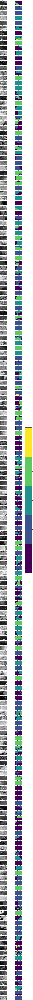

In [27]:
def display_images_and_masks(images, masks, num_images=200, unique_labels=None, label_to_color_index=None, cmap=None):
    """Displays a grid of images and their corresponding masks"""
    num_rows = num_images
    num_cols = 2

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15 * num_rows // 10))

    for i in range(num_images):
        image = images[i]
        mask = masks[i]

        # First column: display image
        axes[i, 0].imshow(image, cmap='gray')
        axes[i, 0].set_title(f"Image {i + 1}")
        axes[i, 0].axis('off')

        # Second column: display mask
        colored_mask = np.vectorize(label_to_color_index.get)(mask)

        im = axes[i, 1].imshow(colored_mask, cmap=cmap, interpolation='nearest',
                               vmin=unique_labels.min(), vmax=unique_labels.max())
        axes[i, 1].set_title(f"Mask {i + 1}")
        axes[i, 1].axis('off')

    plt.tight_layout()
    cbar = fig.colorbar(im, ax=axes.ravel().tolist(), ticks=unique_labels,
                        boundaries=np.arange(unique_labels.min() - 0.5, unique_labels.max() + 1.5, 1))
    plt.show()

display_images_and_masks(X_test[:200], y_test[:200], num_images=200,
                         unique_labels=unique_labels,
                         label_to_color_index=label_to_color_index,
                         cmap=cmap)

# Data augmentation (on training set)

Augmented Training set shape: (6104, 64, 128) (6104, 64, 128)


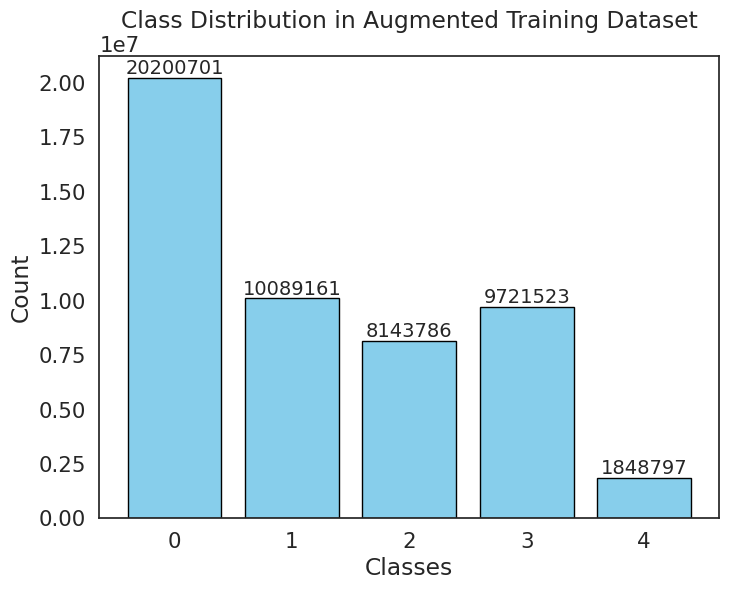

In [38]:
# Class to augment
CLASSES_TO_AUGMENT = {
    4: 100
}
aug = A.Compose([
    A.RandomRotate90(p=0.5),
    A.VerticalFlip(p=0.5),
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=20, p=0.5),
    A.Resize(height=64, width=128, p=1)
])

def augment_class(X, y, target_class, factor, augmentation_fn):
    """Increase the number of images containing the target_class of an augmentation factor"""

    class_indices = [i for i, labels in enumerate(y) if target_class in labels]
    X_class = X[class_indices]
    y_class = y[class_indices]
    n_to_generate = len(X_class) * (factor - 1)
    X_augmented = []
    y_augmented = []
    repeats_per_image = factor - 1

    for X_img, y_mask in zip(X_class, y_class):
        for _ in range(repeats_per_image):
            augmented = augmentation_fn(image=X_img, mask=y_mask)
            augmented_img = augmented['image']
            augmented_mask = augmented['mask']

            X_augmented.append(augmented_img)
            y_augmented.append(augmented_mask)

    X_augmented = np.array(X_augmented)
    y_augmented = np.array(y_augmented)

    X_new = np.concatenate([X, X_augmented], axis=0)
    y_new = np.concatenate([y, y_augmented], axis=0)

    return X_new, y_new

X_train_augmented = X_train_final
y_train_augmented = y_train_final


for cls, factor in CLASSES_TO_AUGMENT.items():
    X_train_augmented, y_train_augmented = augment_class(X_train_augmented,
                                                         y_train_augmented,
                                                         cls,
                                                         factor,
                                                         aug)


print("Augmented Training set shape:", X_train_augmented.shape, y_train_augmented.shape)

classes, count = np.unique(y_train_augmented.flatten(), return_counts=True)
plt.figure(figsize=(8, 6))
plt.bar(classes, count, color='skyblue', edgecolor='black')
plt.xlabel("Classes")
plt.ylabel("Count")
plt.title("Class Distribution in Augmented Training Dataset")
for i, cnt in enumerate(count):
    plt.text(classes[i], cnt, str(cnt), ha='center', va='bottom')
plt.show()


In [39]:
X_train = X_train_augmented
y_train = y_train_augmented

In [40]:
def get_colormap(num_classes = num_classes):
  """Definition of the colormap to plot the images, to distinguish """
  colormap = plt.cm.get_cmap('viridis', len(unique_labels))
  return colormap

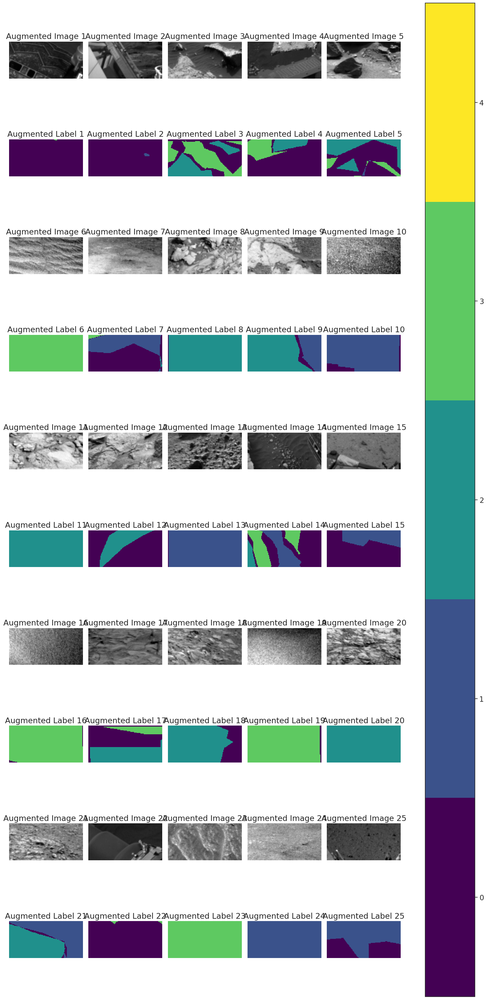

In [41]:
def apply_colormap(label, colormap=None):
    """
    Apply the colormap to a label
    """
    label = np.squeeze(label)

    if colormap is None:
        num_classes = len(np.unique(label))
        colormap = get_colormap(num_classes)
    if isinstance(colormap, mcolors.ListedColormap):
        colormap = colormap.colors
    colored = colormap[label.astype(int)]

    return colored

fig, axes = plt.subplots(nrows=10, ncols=5, figsize=(15, 30))
num_images_to_display = len(X_train)

colormap = get_colormap(num_classes)

for i in range(min(num_images_to_display, len(X_train))):
    row = i // 5
    col = i % 5

    if row * 2 < axes.shape[0]:
        axes[row * 2, col].imshow(X_train[i], cmap='gray')
        axes[row * 2, col].set_title(f"Augmented Image {i + 1}")
        axes[row * 2, col].axis('off')

        if row * 2 + 1 < axes.shape[0]:
            # Define label_to_color_index as a dictionary mapping labels to color indices
            label_to_color_index = {label: i for i, label in enumerate(np.unique(y_train))}
            colored_label = apply_colormap(y_train[i], colormap)
            im = axes[row * 2 + 1, col].imshow(
                colored_label,
                cmap=cmap,
                interpolation='nearest',
                vmin=unique_labels.min(),
                vmax=unique_labels.max()
            )
            axes[row * 2 + 1, col].set_title(f"Augmented Label {i + 1}")
            axes[row * 2 + 1, col].axis('off')
plt.tight_layout()
fig.colorbar(im, ax=axes.ravel().tolist(), ticks=unique_labels,
             boundaries=np.arange(unique_labels.min() - 0.5, unique_labels.max() + 1.5, 1))
plt.show()

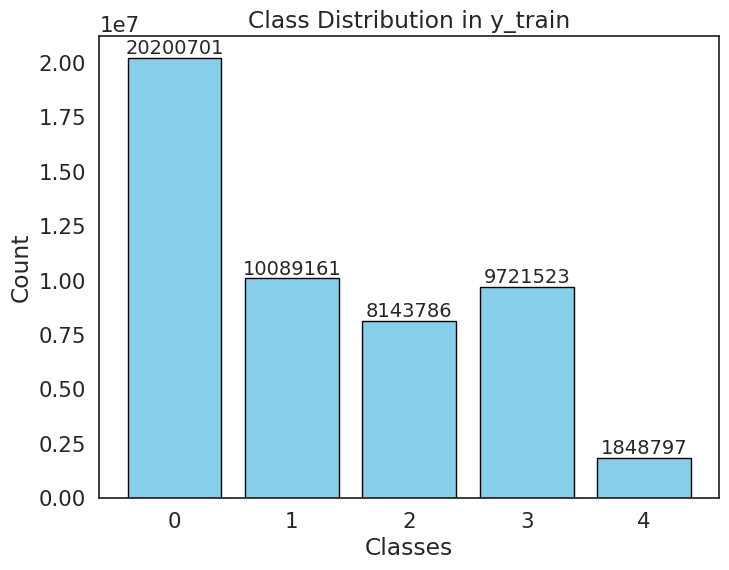

In [42]:
# Plot distribution of augmented y_train
classes,count = np.unique(y_train_augmented,return_counts=True)

plt.figure(figsize=(8, 6))
plt.bar(classes, count, color='skyblue', edgecolor='black')

plt.xlabel("Classes")
plt.ylabel("Count")
plt.title("Class Distribution in y_train")

for i, count in enumerate(count):
    plt.text(classes[i], count , str(count), ha='center', va='bottom')

plt.show()

# Model


In [43]:
# MultiResUnet
def conv2d_bn(x, filters, num_row, num_col, padding='same', strides=(1, 1), activation='relu', name=None):
    x = Conv2D(filters, (num_row, num_col), strides=strides, padding=padding, use_bias=False)(x)
    x = BatchNormalization(axis=3, scale=False)(x)

    if(activation == None):
        return x

    x = Activation(activation, name=name)(x)
    return x


def trans_conv2d_bn(x, filters, num_row, num_col, padding='same', strides=(2, 2), name=None):
    x = Conv2DTranspose(filters, (num_row, num_col), strides=strides, padding=padding)(x)
    x = BatchNormalization(axis=3, scale=False)(x)
    return x

def MultiResBlock(U, inp, alpha = 1.67):
    W = alpha * U
    shortcut = inp
    shortcut = conv2d_bn(shortcut, int(W*0.167) + int(W*0.333) + int(W*0.5), 1, 1, activation=None, padding='same')

    conv3x3 = conv2d_bn(inp, int(W*0.167), 3, 3, activation='relu', padding='same')
    conv5x5 = conv2d_bn(conv3x3, int(W*0.333), 3, 3, activation='relu', padding='same')
    conv7x7 = conv2d_bn(conv5x5, int(W*0.5), 3, 3, activation='relu', padding='same')

    out = concatenate([conv3x3, conv5x5, conv7x7], axis=3)
    out = BatchNormalization(axis=3)(out)
    out = add([shortcut, out])
    out = Activation('relu')(out)
    out = BatchNormalization(axis=3)(out)
    return out

def ResPath(filters, length, inp):
    shortcut = inp
    shortcut = conv2d_bn(shortcut, filters, 1, 1, activation=None, padding='same')

    out = conv2d_bn(inp, filters, 3, 3, activation='relu', padding='same')
    out = add([shortcut, out])
    out = Activation('relu')(out)
    out = BatchNormalization(axis=3)(out)

    for i in range(length-1):
        shortcut = out
        shortcut = conv2d_bn(shortcut, filters, 1, 1, activation=None, padding='same')
        out = conv2d_bn(out, filters, 3, 3, activation='relu', padding='same')
        out = add([shortcut, out])
        out = Activation('relu')(out)
        out = BatchNormalization(axis=3)(out)
    return out

def get_resUnet(height, width, n_channels, num_classes):
    inputs = Input((height, width, n_channels))

    mresblock1 = MultiResBlock(32, inputs)
    pool1 = MaxPooling2D(pool_size=(2, 2))(mresblock1)
    mresblock1 = ResPath(32, 4, mresblock1)
    mresblock2 = MultiResBlock(32*2, pool1)
    pool2 = MaxPooling2D(pool_size=(2, 2))(mresblock2)
    mresblock2 = ResPath(32*2, 3, mresblock2)
    mresblock3 = MultiResBlock(32*4, pool2)
    pool3 = MaxPooling2D(pool_size=(2, 2))(mresblock3)
    mresblock3 = ResPath(32*4, 2, mresblock3)
    mresblock4 = MultiResBlock(32*8, pool3)
    pool4 = MaxPooling2D(pool_size=(2, 2))(mresblock4)
    mresblock4 = ResPath(32*8, 1, mresblock4)
    mresblock5 = MultiResBlock(32*16, pool4)

    up6 = concatenate([Conv2DTranspose(32*8, (2, 2), strides=(2, 2), padding='same')(mresblock5), mresblock4], axis=3)
    mresblock6 = MultiResBlock(32*8, up6)
    up7 = concatenate([Conv2DTranspose(32*4, (2, 2), strides=(2, 2), padding='same')(mresblock6), mresblock3], axis=3)
    mresblock7 = MultiResBlock(32*4, up7)
    up8 = concatenate([Conv2DTranspose(32*2, (2, 2), strides=(2, 2), padding='same')(mresblock7), mresblock2], axis=3)
    mresblock8 = MultiResBlock(32*2, up8)
    up9 = concatenate([Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(mresblock8), mresblock1], axis=3)
    mresblock9 = MultiResBlock(32, up9)
    conv10 = conv2d_bn(mresblock9, num_classes, 1, 1, activation='softmax')
    model = Model(inputs=[inputs], outputs=[conv10])

    return model
    if __name__ == "__main__":
      main()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)           ┃ Output Shape         ┃      Param # ┃ Connected to        ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer            │ (None, 64, 128, 1)   │            0 │ -                   │    -    │
│ (InputLayer)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ conv2d_1 (Conv2D)      │ (None, 64, 128, 8)   │           72 │ input_layer[0][0]   │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ batch_normalization_1  │ (None, 64, 128, 8)   │           24 │ conv2d_1[0][0]      │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ activation             │ (None, 64, 128, 8)   │            0 │ batch_normalizatio… │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ conv2d_2 (Conv2D)      │ (None, 64, 128, 17)  │        1,224 │ activation[0][0]    │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ batch_normalization_2  │ (None, 64, 128, 17)  │           51 │ conv2d_2[0][0]      │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ activation_1           │ (None, 64, 128, 17)  │            0 │ batch_normalizatio… │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ conv2d_3 (Conv2D)      │ (None, 64, 128, 26)  │        3,978 │ activation_1[0][0]  │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ batch_normalization_3  │ (None, 64, 128, 26)  │           78 │ conv2d_3[0][0]      │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ activation_2           │ (None, 64, 128, 26)  │            0 │ batch_normalizatio… │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ conv2d (Conv2D)        │ (None, 64, 128, 51)  │           51 │ input_layer[0][0]   │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ concatenate            │ (None, 64, 128, 51)  │            0 │ activation[0][0],   │    -    │
│ (Concatenate)          │                      │              │ activation_1[0][0], │         │
│                        │                      │              │ activation_2[0][0]  │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ batch_normalization    │ (None, 64, 128, 51)  │          153 │ conv2d[0][0]        │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ batch_normalization_4  │ (None, 64, 128, 51)  │          204 │ concatenate[0][0]   │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├──────────────────────

 Total params: 7,262,720 (27.71 MB)

 Trainable params: 7,238,190 (27.61 MB)

 Non-trainable params: 24,530 (95.82 KB)

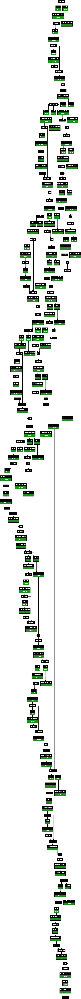

In [44]:
num_classes = len(classes)
input_shape = (64,128,1)

model = get_resUnet(input_shape[0], input_shape[1], input_shape[2], num_classes)

# Print a detailed summary of the model with expanded nested layers and trainable parameters
model.summary(expand_nested=True, show_trainable=True)

# Generate and display a graphical representation of the model architecture.
tf.keras.utils.plot_model(model, show_trainable=True, expand_nested=True, dpi=70)

In [48]:
# Definition of the hyperparameter
LEARNING_RATE = 0.01
BATCH_SIZE = 64
EPOCHS = 1000
PATIENCE = 30
NUM_CLASSES = num_classes

In [49]:
class MeanIntersectionOverUnion(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes, name="mean_iou", dtype=None):
        super(MeanIntersectionOverUnion, self).__init__(num_classes=num_classes, name=name, dtype=dtype, ignore_class=0)

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Convert predictions to class labels
        y_pred = tf.math.argmax(y_pred, axis=-1)

        # Flatten the tensors
        y_true = tf.reshape(y_true, [-1])
        y_pred = tf.reshape(y_pred, [-1])

        # Update the state
        return super().update_state(y_true, y_pred, sample_weight)

In [50]:
def apply_colormap(label, colormap=None):
    """
    Apply the colormap to a label.
    """
    # Ensure label is 2D
    label = np.squeeze(label)

    if colormap is None:
        num_classes = len(np.unique(label))
        colormap = get_colormap(num_classes)
    if isinstance(colormap, mcolors.ListedColormap):
        colormap = colormap.colors
    # Apply the colormap
    colored = colormap[label.astype(int)]

    return colored

In [51]:
# Visualization callback
class VizCallback(tf.keras.callbacks.Callback):
    def __init__(self, image, label, frequency=5):
        super().__init__()
        self.image = image
        self.label = label
        self.frequency = frequency

    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.frequency == 0:
            image, label = self.image, self.label

            image = tf.expand_dims(image, 0)
            pred = self.model.predict(image, verbose=0)
            y_pred = tf.math.argmax(pred, axis=-1)
            y_pred = y_pred.numpy()

            num_classes = NUM_CLASSES

            colormap = get_colormap(num_classes)

            plt.figure(figsize=(16, 4))

            plt.subplot(1, 3, 1)
            plt.imshow(image[0],cmap='gray')
            plt.title("Input Image")
            plt.axis('off')

            plt.subplot(1, 3, 2)
            colored_label = apply_colormap(label, colormap)

            plt.imshow(colored_label)
            plt.title("Ground Truth Mask")
            plt.axis('off')

            # Prediction
            plt.subplot(1, 3, 3)
            colored_pred = apply_colormap(y_pred[0],colormap)
            plt.imshow(colored_pred)
            plt.title("Predicted Mask")
            plt.axis('off')

            plt.tight_layout()
            plt.show()
            plt.close()

In [52]:
# Compile the model
model.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(ignore_class=0),
    optimizer=AdamW(learning_rate=LEARNING_RATE),
    metrics=["accuracy", MeanIntersectionOverUnion(num_classes=num_classes)]
)

In [53]:
# Early stopping to prevent overfitting
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',
    mode='max',
    patience=PATIENCE,
    restore_best_weights=True
)

viz_callback = VizCallback(X_val[0], y_val[0])

In [54]:
# Normalization of values from [0-255] to [0-1]
X_train = X_train/255.0
y_train = y_train.astype(np.float32)
X_val = X_val/255.0
y_val = y_val.astype(np.float32)

Epoch 1/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 912ms/step - accuracy: 0.2576 - loss: 1.3865 - mean_iou: 0.1666

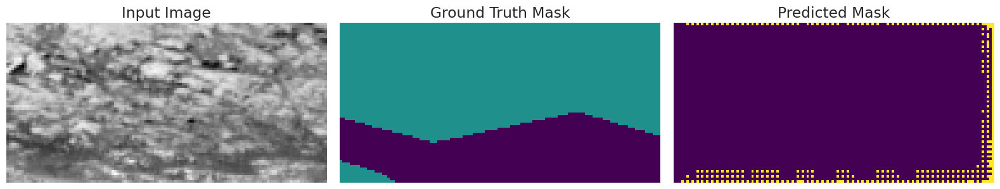

96/96 ━━━━━━━━━━━━━━━━━━━━ 224s 1s/step - accuracy: 0.2579 - loss: 1.3849 - mean_iou: 0.1670 - val_accuracy: 0.3622 - val_loss: 8.1082 - val_mean_iou: 0.0922
Epoch 2/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 37s 386ms/step - accuracy: 0.3258 - loss: 1.0376 - mean_iou: 0.2610 - val_accuracy: 0.2111 - val_loss: 10.9519 - val_mean_iou: 0.0800
Epoch 3/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 381ms/step - accuracy: 0.3558 - loss: 0.9345 - mean_iou: 0.2901 - val_accuracy: 0.2939 - val_loss: 3.1551 - val_mean_iou: 0.1559
Epoch 4/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 385ms/step - accuracy: 0.3623 - loss: 0.8914 - mean_iou: 0.3723 - val_accuracy: 0.4305 - val_loss: 1.2747 - val_mean_iou: 0.2467
Epoch 5/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 36s 376ms/step - accuracy: 0.3754 - loss: 0.8480 - mean_iou: 0.3970 - val_accuracy: 0.4350 - val_loss: 1.2994 - val_mean_iou: 0.2764
Epoch 6/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step - accuracy: 0.3765 - loss: 0.8420 - mean_iou: 0.4014

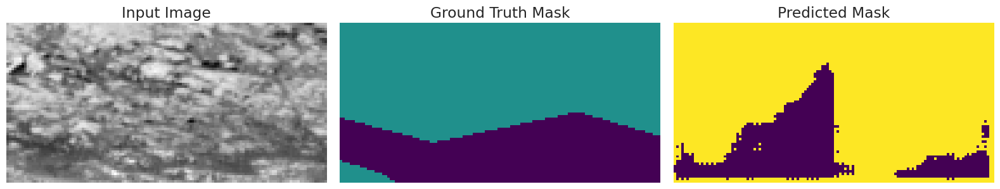

96/96 ━━━━━━━━━━━━━━━━━━━━ 37s 383ms/step - accuracy: 0.3766 - loss: 0.8419 - mean_iou: 0.4015 - val_accuracy: 0.5140 - val_loss: 0.7746 - val_mean_iou: 0.3333
Epoch 7/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 378ms/step - accuracy: 0.3925 - loss: 0.7929 - mean_iou: 0.4330 - val_accuracy: 0.5657 - val_loss: 0.7373 - val_mean_iou: 0.3207
Epoch 8/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 37s 382ms/step - accuracy: 0.3980 - loss: 0.7677 - mean_iou: 0.4457 - val_accuracy: 0.4216 - val_loss: 1.0808 - val_mean_iou: 0.2947
Epoch 9/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 383ms/step - accuracy: 0.4031 - loss: 0.7479 - mean_iou: 0.4573 - val_accuracy: 0.5932 - val_loss: 0.6020 - val_mean_iou: 0.4466
Epoch 10/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 37s 383ms/step - accuracy: 0.4134 - loss: 0.7199 - mean_iou: 0.4785 - val_accuracy: 0.5037 - val_loss: 0.9425 - val_mean_iou: 0.3808
Epoch 11/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step - accuracy: 0.4176 - loss: 0.7016 - mean_iou: 0.4890

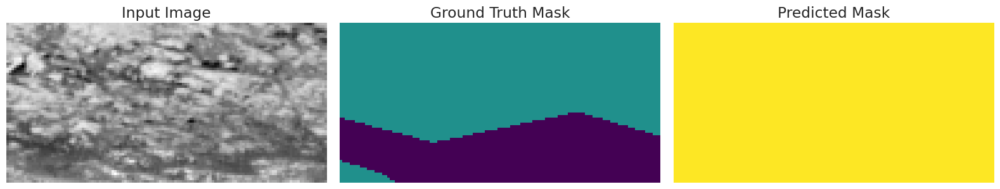

96/96 ━━━━━━━━━━━━━━━━━━━━ 42s 389ms/step - accuracy: 0.4176 - loss: 0.7017 - mean_iou: 0.4890 - val_accuracy: 0.5702 - val_loss: 0.7354 - val_mean_iou: 0.4118
Epoch 12/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 40s 379ms/step - accuracy: 0.4203 - loss: 0.6955 - mean_iou: 0.4959 - val_accuracy: 0.6863 - val_loss: 0.3714 - val_mean_iou: 0.5798
Epoch 13/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 36s 376ms/step - accuracy: 0.4290 - loss: 0.6609 - mean_iou: 0.5170 - val_accuracy: 0.3588 - val_loss: 1.5935 - val_mean_iou: 0.2388
Epoch 14/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 376ms/step - accuracy: 0.4351 - loss: 0.6392 - mean_iou: 0.5333 - val_accuracy: 0.6664 - val_loss: 0.4750 - val_mean_iou: 0.5664
Epoch 15/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 376ms/step - accuracy: 0.4370 - loss: 0.6293 - mean_iou: 0.5387 - val_accuracy: 0.6029 - val_loss: 0.6517 - val_mean_iou: 0.4908
Epoch 16/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step - accuracy: 0.4430 - loss: 0.6147 - mean_iou: 0.5531

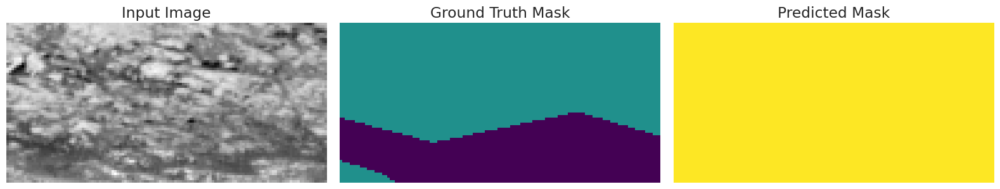

96/96 ━━━━━━━━━━━━━━━━━━━━ 42s 384ms/step - accuracy: 0.4430 - loss: 0.6147 - mean_iou: 0.5530 - val_accuracy: 0.6434 - val_loss: 0.5002 - val_mean_iou: 0.5194
Epoch 17/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 384ms/step - accuracy: 0.4414 - loss: 0.6163 - mean_iou: 0.5480 - val_accuracy: 0.4967 - val_loss: 1.0744 - val_mean_iou: 0.3854
Epoch 18/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 383ms/step - accuracy: 0.4451 - loss: 0.6033 - mean_iou: 0.5599 - val_accuracy: 0.5525 - val_loss: 0.8381 - val_mean_iou: 0.4212
Epoch 19/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 382ms/step - accuracy: 0.4427 - loss: 0.6087 - mean_iou: 0.5538 - val_accuracy: 0.5625 - val_loss: 0.8228 - val_mean_iou: 0.4245
Epoch 20/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 40s 377ms/step - accuracy: 0.4462 - loss: 0.6010 - mean_iou: 0.5623 - val_accuracy: 0.5990 - val_loss: 0.7134 - val_mean_iou: 0.4817
Epoch 21/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step - accuracy: 0.4519 - loss: 0.5792 - mean_iou: 0.5762

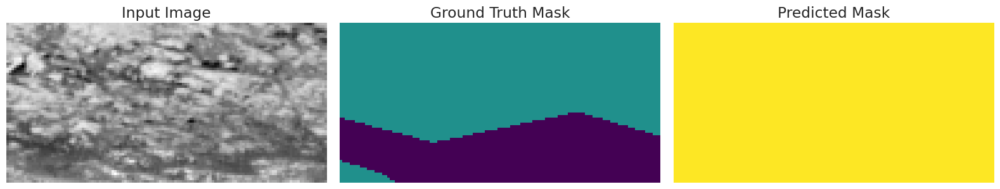

96/96 ━━━━━━━━━━━━━━━━━━━━ 42s 392ms/step - accuracy: 0.4519 - loss: 0.5792 - mean_iou: 0.5763 - val_accuracy: 0.6660 - val_loss: 0.4670 - val_mean_iou: 0.5498
Epoch 22/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 36s 378ms/step - accuracy: 0.4502 - loss: 0.5838 - mean_iou: 0.5735 - val_accuracy: 0.6948 - val_loss: 0.3752 - val_mean_iou: 0.5897
Epoch 23/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 376ms/step - accuracy: 0.4503 - loss: 0.5825 - mean_iou: 0.5739 - val_accuracy: 0.5282 - val_loss: 0.8501 - val_mean_iou: 0.3778
Epoch 24/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 37s 384ms/step - accuracy: 0.4555 - loss: 0.5638 - mean_iou: 0.5853 - val_accuracy: 0.5995 - val_loss: 0.6256 - val_mean_iou: 0.4685
Epoch 25/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 36s 375ms/step - accuracy: 0.4522 - loss: 0.5738 - mean_iou: 0.5789 - val_accuracy: 0.5384 - val_loss: 0.8596 - val_mean_iou: 0.4038
Epoch 26/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step - accuracy: 0.4570 - loss: 0.5582 - mean_iou: 0.5898

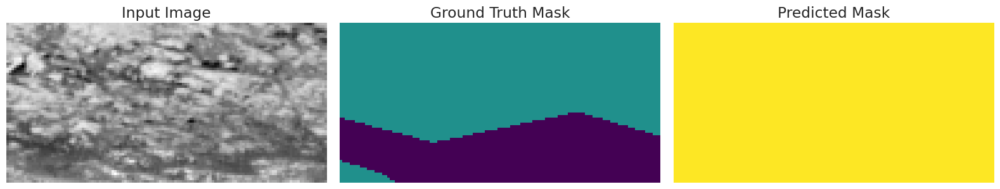

96/96 ━━━━━━━━━━━━━━━━━━━━ 37s 384ms/step - accuracy: 0.4570 - loss: 0.5582 - mean_iou: 0.5899 - val_accuracy: 0.4529 - val_loss: 1.1628 - val_mean_iou: 0.3325
Epoch 27/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 40s 377ms/step - accuracy: 0.4579 - loss: 0.5549 - mean_iou: 0.5929 - val_accuracy: 0.5197 - val_loss: 1.0265 - val_mean_iou: 0.4020
Epoch 28/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 42s 383ms/step - accuracy: 0.4586 - loss: 0.5518 - mean_iou: 0.5952 - val_accuracy: 0.3625 - val_loss: 1.5515 - val_mean_iou: 0.2490
Epoch 29/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 383ms/step - accuracy: 0.4569 - loss: 0.5570 - mean_iou: 0.5919 - val_accuracy: 0.5615 - val_loss: 0.8207 - val_mean_iou: 0.4379
Epoch 30/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 36s 376ms/step - accuracy: 0.4565 - loss: 0.5598 - mean_iou: 0.5895 - val_accuracy: 0.6198 - val_loss: 0.6141 - val_mean_iou: 0.5028
Epoch 31/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step - accuracy: 0.4588 - loss: 0.5495 - mean_iou: 0.5963

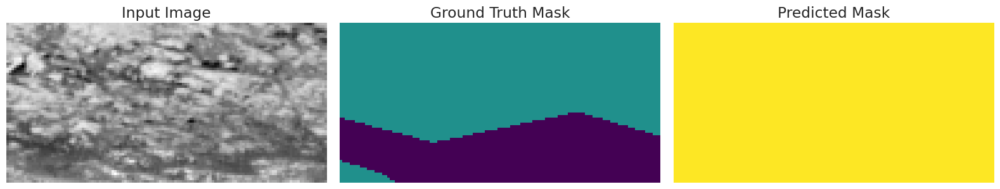

96/96 ━━━━━━━━━━━━━━━━━━━━ 42s 382ms/step - accuracy: 0.4589 - loss: 0.5494 - mean_iou: 0.5964 - val_accuracy: 0.6578 - val_loss: 0.4916 - val_mean_iou: 0.5348
Epoch 32/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 383ms/step - accuracy: 0.4621 - loss: 0.5363 - mean_iou: 0.6042 - val_accuracy: 0.6932 - val_loss: 0.3860 - val_mean_iou: 0.5908
Epoch 33/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 36s 378ms/step - accuracy: 0.4637 - loss: 0.5287 - mean_iou: 0.6075 - val_accuracy: 0.6993 - val_loss: 0.3728 - val_mean_iou: 0.5985
Epoch 34/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 377ms/step - accuracy: 0.4654 - loss: 0.5214 - mean_iou: 0.6121 - val_accuracy: 0.6846 - val_loss: 0.4089 - val_mean_iou: 0.5780
Epoch 35/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 379ms/step - accuracy: 0.4661 - loss: 0.5175 - mean_iou: 0.6139 - val_accuracy: 0.6818 - val_loss: 0.4141 - val_mean_iou: 0.5701
Epoch 36/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step - accuracy: 0.4665 - loss: 0.5144 - mean_iou: 0.6149

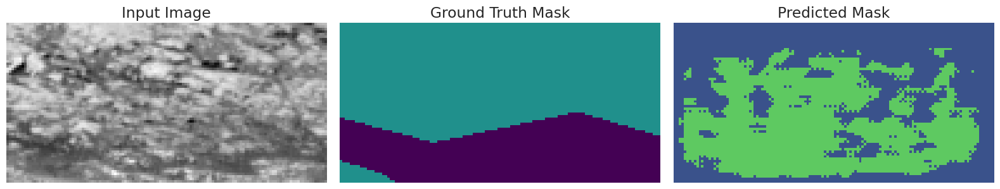

96/96 ━━━━━━━━━━━━━━━━━━━━ 42s 392ms/step - accuracy: 0.4665 - loss: 0.5144 - mean_iou: 0.6149 - val_accuracy: 0.6866 - val_loss: 0.4085 - val_mean_iou: 0.5782
Epoch 37/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 36s 377ms/step - accuracy: 0.4670 - loss: 0.5121 - mean_iou: 0.6160 - val_accuracy: 0.6952 - val_loss: 0.3806 - val_mean_iou: 0.5897
Epoch 38/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 36s 378ms/step - accuracy: 0.4673 - loss: 0.5107 - mean_iou: 0.6163 - val_accuracy: 0.7019 - val_loss: 0.3620 - val_mean_iou: 0.6020
Epoch 39/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 37s 383ms/step - accuracy: 0.4671 - loss: 0.5096 - mean_iou: 0.6159 - val_accuracy: 0.6965 - val_loss: 0.3705 - val_mean_iou: 0.5913
Epoch 40/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 40s 378ms/step - accuracy: 0.4674 - loss: 0.5085 - mean_iou: 0.6165 - val_accuracy: 0.7003 - val_loss: 0.3680 - val_mean_iou: 0.5998
Epoch 41/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step - accuracy: 0.4675 - loss: 0.5079 - mean_iou: 0.6167

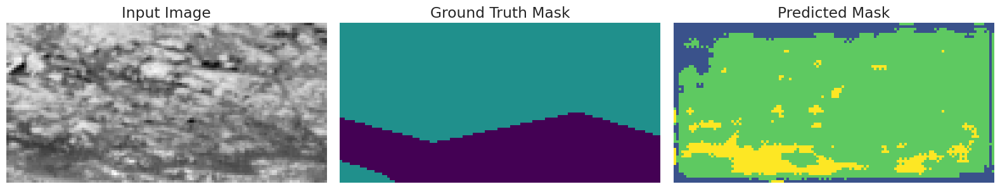

96/96 ━━━━━━━━━━━━━━━━━━━━ 42s 384ms/step - accuracy: 0.4675 - loss: 0.5079 - mean_iou: 0.6167 - val_accuracy: 0.6826 - val_loss: 0.3963 - val_mean_iou: 0.5677
Epoch 42/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 383ms/step - accuracy: 0.4677 - loss: 0.5068 - mean_iou: 0.6172 - val_accuracy: 0.6932 - val_loss: 0.3752 - val_mean_iou: 0.5854
Epoch 43/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 384ms/step - accuracy: 0.4676 - loss: 0.5061 - mean_iou: 0.6169 - val_accuracy: 0.6877 - val_loss: 0.3848 - val_mean_iou: 0.5779
Epoch 44/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 37s 383ms/step - accuracy: 0.4676 - loss: 0.5055 - mean_iou: 0.6169 - val_accuracy: 0.6948 - val_loss: 0.3744 - val_mean_iou: 0.5906
Epoch 45/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 40s 377ms/step - accuracy: 0.4671 - loss: 0.5072 - mean_iou: 0.6161 - val_accuracy: 0.6881 - val_loss: 0.3964 - val_mean_iou: 0.5789
Epoch 46/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step - accuracy: 0.4649 - loss: 0.5181 - mean_iou: 0.6113

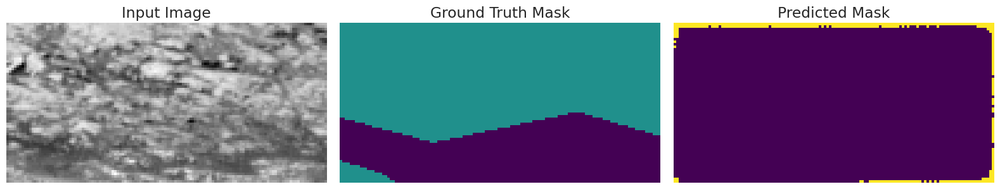

96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 382ms/step - accuracy: 0.4648 - loss: 0.5184 - mean_iou: 0.6112 - val_accuracy: 0.5019 - val_loss: 1.3923 - val_mean_iou: 0.3099
Epoch 47/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 40s 377ms/step - accuracy: 0.4399 - loss: 0.6205 - mean_iou: 0.5509 - val_accuracy: 0.1480 - val_loss: 5.2946 - val_mean_iou: 0.1020
Epoch 48/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 378ms/step - accuracy: 0.4425 - loss: 0.6058 - mean_iou: 0.5565 - val_accuracy: 0.6080 - val_loss: 0.6765 - val_mean_iou: 0.4790
Epoch 49/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 37s 384ms/step - accuracy: 0.4602 - loss: 0.5413 - mean_iou: 0.5999 - val_accuracy: 0.5520 - val_loss: 0.7611 - val_mean_iou: 0.4137
Epoch 50/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 40s 378ms/step - accuracy: 0.4606 - loss: 0.5390 - mean_iou: 0.6022 - val_accuracy: 0.6802 - val_loss: 0.4272 - val_mean_iou: 0.5662
Epoch 51/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step - accuracy: 0.4631 - loss: 0.5275 - mean_iou: 0.6084

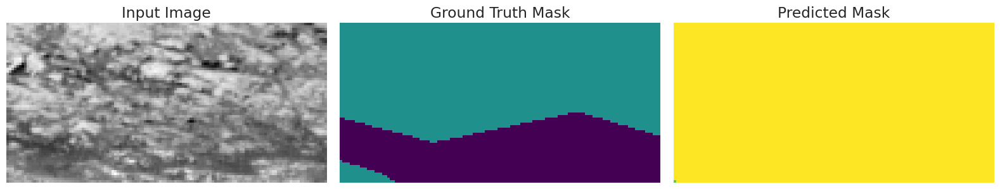

96/96 ━━━━━━━━━━━━━━━━━━━━ 42s 386ms/step - accuracy: 0.4631 - loss: 0.5274 - mean_iou: 0.6084 - val_accuracy: 0.6834 - val_loss: 0.4143 - val_mean_iou: 0.5730
Epoch 52/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 36s 377ms/step - accuracy: 0.4659 - loss: 0.5152 - mean_iou: 0.6134 - val_accuracy: 0.5488 - val_loss: 0.7765 - val_mean_iou: 0.4144
Epoch 53/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 42s 384ms/step - accuracy: 0.4656 - loss: 0.5158 - mean_iou: 0.6135 - val_accuracy: 0.6953 - val_loss: 0.3842 - val_mean_iou: 0.5890
Epoch 54/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 40s 378ms/step - accuracy: 0.4674 - loss: 0.5089 - mean_iou: 0.6166 - val_accuracy: 0.6928 - val_loss: 0.3860 - val_mean_iou: 0.5875
Epoch 55/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 36s 378ms/step - accuracy: 0.4678 - loss: 0.5059 - mean_iou: 0.6174 - val_accuracy: 0.6954 - val_loss: 0.3797 - val_mean_iou: 0.5927
Epoch 56/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step - accuracy: 0.4683 - loss: 0.5037 - mean_iou: 0.6182

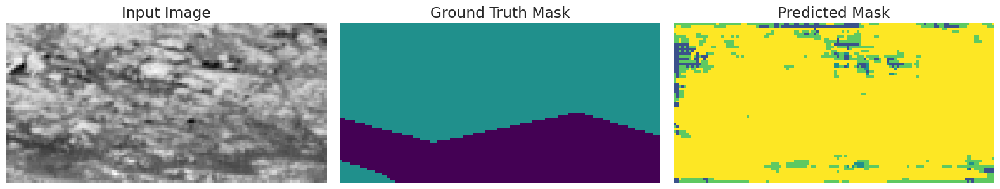

96/96 ━━━━━━━━━━━━━━━━━━━━ 42s 384ms/step - accuracy: 0.4683 - loss: 0.5037 - mean_iou: 0.6183 - val_accuracy: 0.6933 - val_loss: 0.3794 - val_mean_iou: 0.5896
Epoch 57/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 36s 378ms/step - accuracy: 0.4683 - loss: 0.5022 - mean_iou: 0.6186 - val_accuracy: 0.6919 - val_loss: 0.3757 - val_mean_iou: 0.5834
Epoch 58/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 42s 385ms/step - accuracy: 0.4685 - loss: 0.5012 - mean_iou: 0.6189 - val_accuracy: 0.6843 - val_loss: 0.3892 - val_mean_iou: 0.5755
Epoch 59/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 384ms/step - accuracy: 0.4687 - loss: 0.5002 - mean_iou: 0.6189 - val_accuracy: 0.6859 - val_loss: 0.3806 - val_mean_iou: 0.5760
Epoch 60/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 384ms/step - accuracy: 0.4690 - loss: 0.4999 - mean_iou: 0.6192 - val_accuracy: 0.6955 - val_loss: 0.3724 - val_mean_iou: 0.5936
Epoch 61/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step - accuracy: 0.4688 - loss: 0.5001 - mean_iou: 0.6189

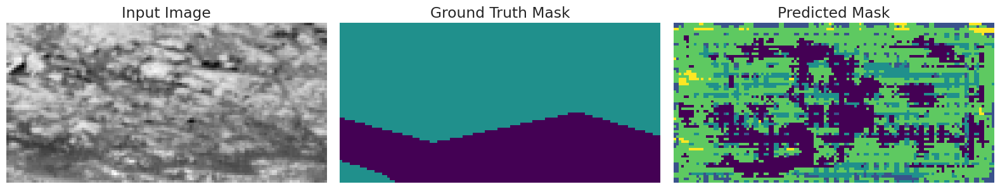

96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 386ms/step - accuracy: 0.4688 - loss: 0.5001 - mean_iou: 0.6189 - val_accuracy: 0.6937 - val_loss: 0.3719 - val_mean_iou: 0.5883
Epoch 62/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 40s 378ms/step - accuracy: 0.4691 - loss: 0.4991 - mean_iou: 0.6189 - val_accuracy: 0.6969 - val_loss: 0.3676 - val_mean_iou: 0.5941
Epoch 63/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 384ms/step - accuracy: 0.4693 - loss: 0.4986 - mean_iou: 0.6192 - val_accuracy: 0.6915 - val_loss: 0.3775 - val_mean_iou: 0.5865
Epoch 64/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 40s 378ms/step - accuracy: 0.4690 - loss: 0.4982 - mean_iou: 0.6179 - val_accuracy: 0.6840 - val_loss: 0.4011 - val_mean_iou: 0.5745
Epoch 65/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 384ms/step - accuracy: 0.4693 - loss: 0.4985 - mean_iou: 0.6187 - val_accuracy: 0.6886 - val_loss: 0.3960 - val_mean_iou: 0.5828
Epoch 66/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step - accuracy: 0.4701 - loss: 0.4973 - mean_iou: 0.6193

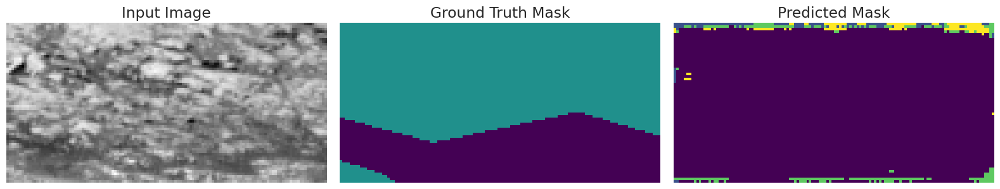

96/96 ━━━━━━━━━━━━━━━━━━━━ 41s 386ms/step - accuracy: 0.4701 - loss: 0.4973 - mean_iou: 0.6193 - val_accuracy: 0.6953 - val_loss: 0.3827 - val_mean_iou: 0.5956
Epoch 67/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 40s 378ms/step - accuracy: 0.4702 - loss: 0.4967 - mean_iou: 0.6194 - val_accuracy: 0.6919 - val_loss: 0.3859 - val_mean_iou: 0.5875
Epoch 68/1000
96/96 ━━━━━━━━━━━━━━━━━━━━ 42s 384ms/step - accuracy: 0.4700 - loss: 0.4972 - mean_iou: 0.6188 - val_accuracy: 0.6818 - val_loss: 0.4070 - val_mean_iou: 0.5700
Final validation Mean Intersection Over Union: 60.2%


In [ ]:
# Train the model
history = model.fit(
    X_train,y_train,
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=[X_val,y_val],
    callbacks=[early_stopping, viz_callback],
    verbose=1
).history

# Calculate and print the final validation accuracy
final_val_meanIoU = round(max(history['val_mean_iou'])* 100, 2)
print(f'Final validation Mean Intersection Over Union: {final_val_meanIoU}%')

# Save the trained model to a file with the accuracy included in the filename
model_filename = 'MultiResUnet_'+str(final_val_meanIoU)+'.keras'
model.save(model_filename)

# Delete the model to free up resources
del model

In [ ]:
final_val_accuracy = round(max(history['val_accuracy'])* 100, 2)
print(f'Final validation accuracy: {final_val_accuracy}%')

Final validation accuracy: 70.19%


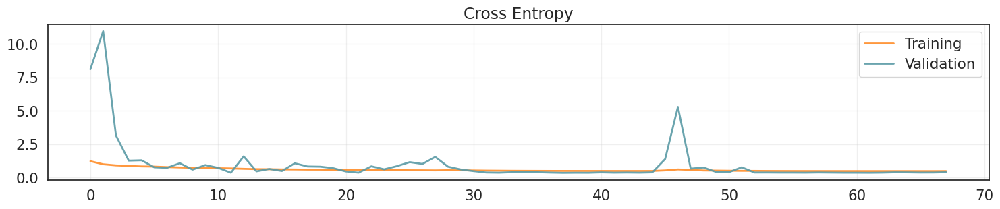

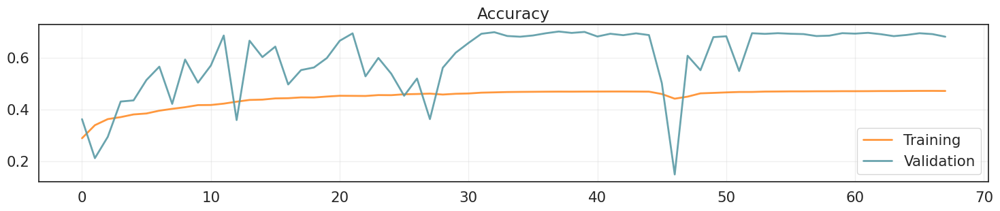

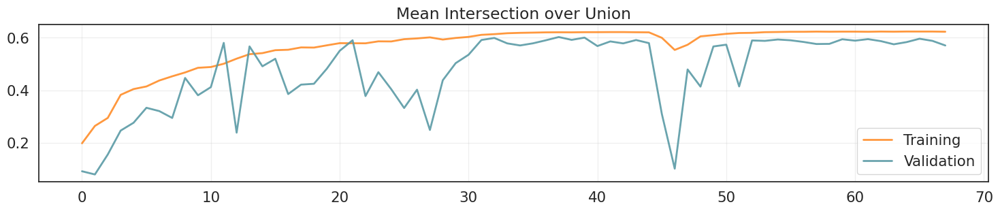

In [ ]:
# Plot and display training and validation loss
plt.figure(figsize=(18, 3))
plt.plot(history['loss'], label='Training', alpha=0.8, color='#ff7f0e', linewidth=2)
plt.plot(history['val_loss'], label='Validation', alpha=0.9, color='#5a9aa5', linewidth=2)
plt.title('Cross Entropy')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# Plot and display training and validation accuracy
plt.figure(figsize=(18, 3))
plt.plot(history['accuracy'], label='Training', alpha=0.8, color='#ff7f0e', linewidth=2)
plt.plot(history['val_accuracy'], label='Validation', alpha=0.9, color='#5a9aa5', linewidth=2)
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# Plot and display training and validation mean IoU
plt.figure(figsize=(18, 3))
plt.plot(history['mean_iou'], label='Training', alpha=0.8, color='#ff7f0e', linewidth=2)
plt.plot(history['val_mean_iou'], label='Validation', alpha=0.9, color='#5a9aa5', linewidth=2)
plt.title('Mean Intersection over Union')
plt.legend()
plt.grid(alpha=0.3)
plt.show()

Test Accuracy: 0.7019
Test Mean Intersection over Union: 0.602


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┓
┃ Layer (type)           ┃ Output Shape         ┃      Param # ┃ Connected to        ┃ Traina… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━┩
│ input_layer            │ (None, 64, 128, 1)   │            0 │ -                   │    -    │
│ (InputLayer)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ conv2d_1 (Conv2D)      │ (None, 64, 128, 8)   │           72 │ input_layer[0][0]   │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ batch_normalization_1  │ (None, 64, 128, 8)   │           24 │ conv2d_1[0][0]      │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ activation             │ (None, 64, 128, 8)   │            0 │ batch_normalizatio… │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ conv2d_2 (Conv2D)      │ (None, 64, 128, 17)  │        1,224 │ activation[0][0]    │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ batch_normalization_2  │ (None, 64, 128, 17)  │           51 │ conv2d_2[0][0]      │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ activation_1           │ (None, 64, 128, 17)  │            0 │ batch_normalizatio… │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ conv2d_3 (Conv2D)      │ (None, 64, 128, 26)  │        3,978 │ activation_1[0][0]  │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ batch_normalization_3  │ (None, 64, 128, 26)  │           78 │ conv2d_3[0][0]      │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ activation_2           │ (None, 64, 128, 26)  │            0 │ batch_normalizatio… │    -    │
│ (Activation)           │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ conv2d (Conv2D)        │ (None, 64, 128, 51)  │           51 │ input_layer[0][0]   │    Y    │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ concatenate            │ (None, 64, 128, 51)  │            0 │ activation[0][0],   │    -    │
│ (Concatenate)          │                      │              │ activation_1[0][0], │         │
│                        │                      │              │ activation_2[0][0]  │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ batch_normalization    │ (None, 64, 128, 51)  │          153 │ conv2d[0][0]        │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├────────────────────────┼──────────────────────┼──────────────┼─────────────────────┼─────────┤
│ batch_normalization_4  │ (None, 64, 128, 51)  │          204 │ concatenate[0][0]   │    Y    │
│ (BatchNormalization)   │                      │              │                     │         │
├──────────────────────

 Total params: 7,262,720 (27.71 MB)

 Trainable params: 7,238,190 (27.61 MB)

 Non-trainable params: 24,530 (95.82 KB)

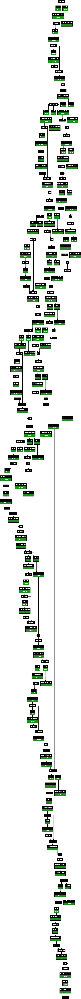

In [55]:
# Load the model
model = tfk.models.load_model("MultiResUnet_60.2.keras", compile=False)

# Compile the model with specified loss, optimizer, and metrics
model.compile(
    loss=tf.keras.losses.SparseCategoricalCrossentropy(ignore_class=0),
    optimizer=tfk.optimizers.AdamW(LEARNING_RATE),
    metrics=["accuracy", MeanIntersectionOverUnion(num_classes=NUM_CLASSES)]
)
test_loss, test_accuracy, test_mean_iou = model.evaluate(X_val, y_val, verbose=0, batch_size=10)
print(f'Test Accuracy: {round(test_accuracy, 4)}')
print(f'Test Mean Intersection over Union: {round(test_mean_iou, 4)}')
# Print a detailed summary of the model with expanded nested layers and trainable parameters.
model.summary(expand_nested=True, show_trainable=True)

# Generate and display a graphical representation of the model architecture.
tf.keras.utils.plot_model(model, show_trainable=True, expand_nested=True, dpi=70)

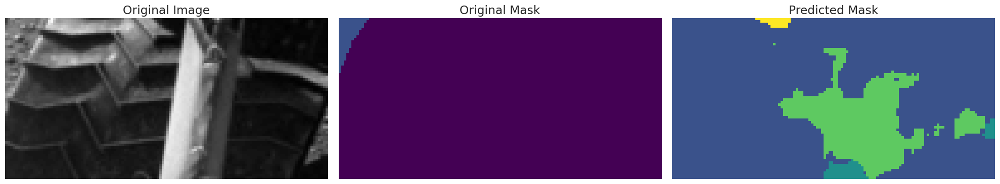

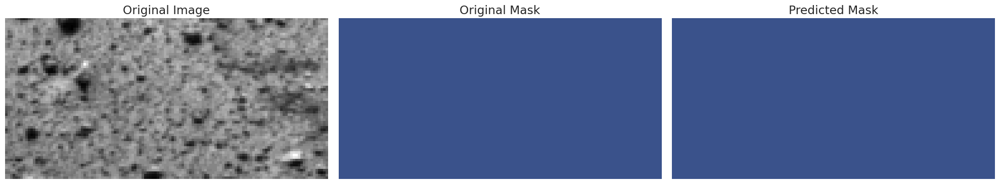

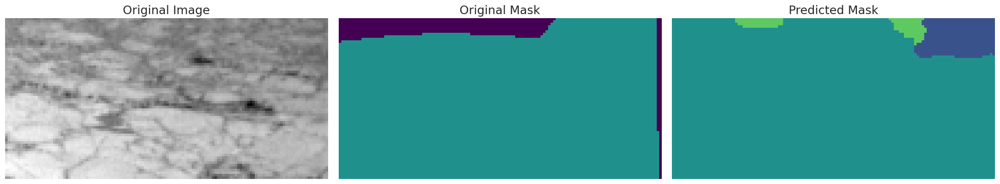

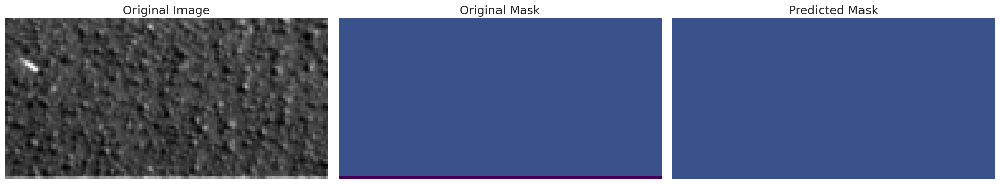

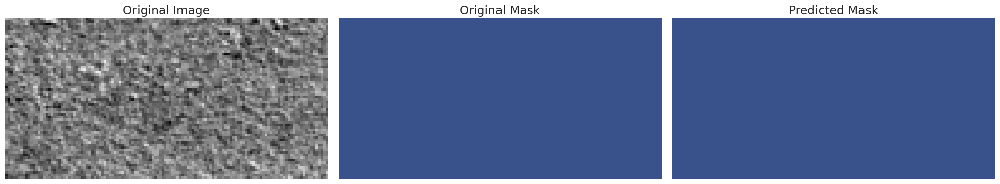

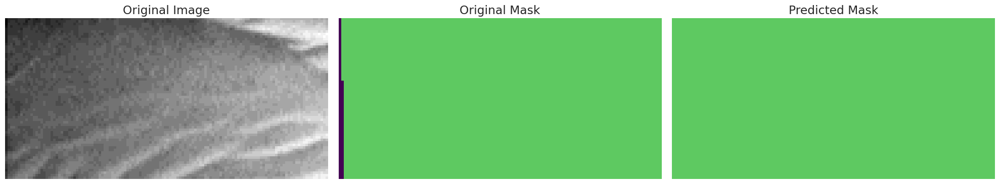

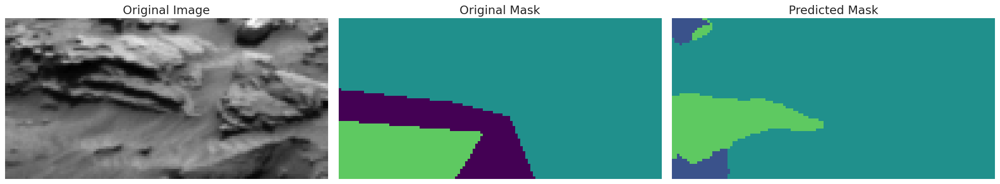

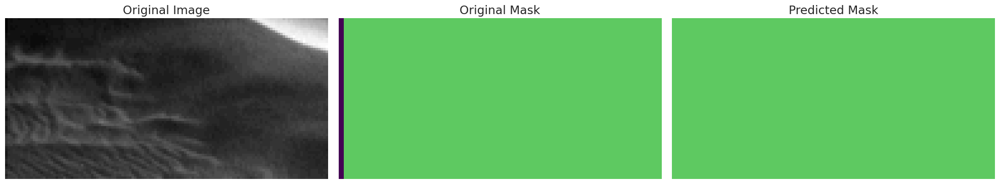

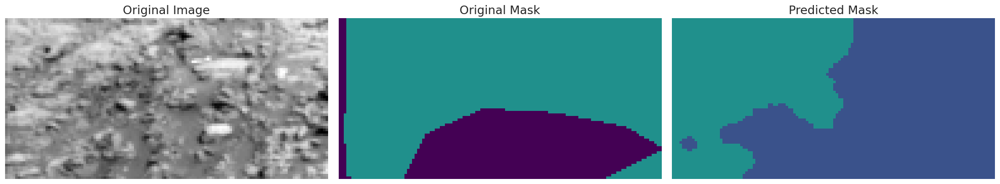

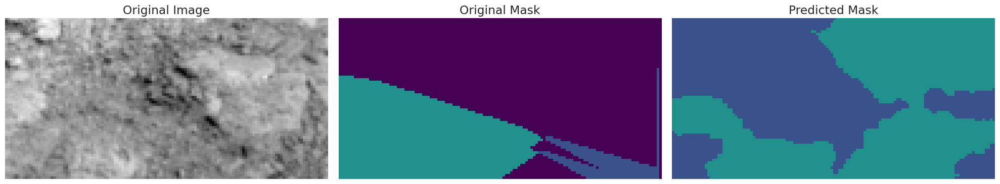

In [ ]:
def plot_triptychs(X,y, model, num_samples=1):
    """
    Plot triptychs (original image, true mask, predicted mask) for samples from a tf.data.Dataset

    Parameters:
    dataset: tf.data.Dataset - The dataset containing image-label pairs
    model: tf.keras.Model - The trained model to generate predictions
    num_samples: int - Number of samples to plot
    """
    # Take samples from the dataset
    samples = np.random.choice(len(X), size=num_samples, replace=False)
    samples = zip(X[samples], y[samples])

    for images, labels in samples:
        if len(images.shape) == 4:
            images = images[0:1]
            labels = labels[0:1]
        # Reshape images to have explicit batch dimension for single sample prediction
        images = images.reshape(1, *images.shape)

        # Generate predictions
        pred = model.predict(images, verbose=0)
        pred = tf.math.argmax(pred, axis=-1)

        # Create colormap based on number of classes in labels
        labels_np = labels
        num_classes = len(np.unique(labels_np))
        colormap = get_colormap(num_classes)

        # Create figure with subplots
        fig, axes = plt.subplots(1, 3, figsize=(20, 4))

        # Plot original image
        axes[0].set_title("Original Image")
        axes[0].imshow(images[0],cmap = 'gray')
        axes[0].axis('off')

        # Plot original mask
        axes[1].set_title("Original Mask")
        colored_label = apply_colormap(labels, colormap)
        axes[1].imshow(colored_label)
        axes[1].axis('off')

        # Plot predicted mask
        axes[2].set_title("Predicted Mask")
        colored_pred = apply_colormap(pred[0], colormap)
        axes[2].imshow(colored_pred)
        axes[2].axis('off')

        plt.tight_layout()
        plt.show()
        plt.close()

plot_triptychs(X_val,y_val, model, num_samples=10)

# Test

In [56]:
X_test = X_test_kaggle / 255.0

y_pred = model.predict(X_test)

y_pred_classes = np.argmax(y_pred, axis=-1)

314/314 ━━━━━━━━━━━━━━━━━━━━ 32s 67ms/step


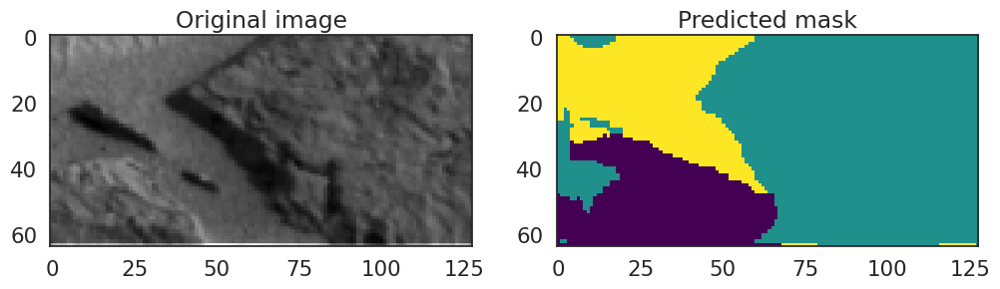

In [57]:
# Visualization of the first image and the predicted mask
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(X_test[0], cmap='gray')
plt.title("Original image")

plt.subplot(1, 2, 2)
plt.imshow(y_pred_classes[0], cmap='viridis')
plt.title("Predicted mask")

plt.show()


In [ ]:
print(f"Predictions shape: {y_pred_classes.shape}")

Predictions shape: (10022, 64, 128)


# For submission

In [ ]:
from datetime import datetime

timestep_str = datetime.now().strftime("%y%m%d_%H%M%S")
model_filename = f"model_{timestep_str}.keras"
model.save(model_filename)
del model

print(f"Model saved to {model_filename}")

Model saved to model_241213_220000.keras


In [ ]:
def y_to_df(y) -> pd.DataFrame:
    """Converts segmentation predictions into a DataFrame format for Kaggle."""
    n_samples = len(y)
    y_flat = y.reshape(n_samples, -1)
    df = pd.DataFrame(y_flat)
    df["id"] = np.arange(n_samples)
    cols = ["id"] + [col for col in df.columns if col != "id"]
    return df[cols]

In [ ]:
timestep_str = model_filename.replace("model_", "").replace(".keras", "")
submission_filename = f"submission_{timestep_str}.csv"
submission_df = y_to_df(y_pred_classes)
submission_df.to_csv(submission_filename, index=False)

from google.colab import files
files.download(submission_filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>